In [1]:
# Importing Libraries and Data
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from tqdm import tqdm
import sys
import tensorflow as tf
import keras.backend as K
import SpectralNormalizationKeras # spectral normalization file
# import ops
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy import asarray
from keras.callbacks import TensorBoard
from numpy.random import randint
from scipy.linalg import sqrtm
from keras.models import load_model
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from skimage.transform import resize
from keras import backend as K
from keras.datasets import cifar10 #Data
from keras.models import Sequential, Model
from keras.layers import Input, Dense, LeakyReLU, BatchNormalization, UpSampling2D, Activation, MaxPooling2D, ReLU, Embedding, Concatenate
from keras.layers import Conv2D, Conv2DTranspose, Reshape, Flatten
from keras.layers import InputSpec
from keras.layers.merge import concatenate
from keras.optimizers import Adam
from keras import initializers
from keras.engine.network import Layer
from keras.utils import plot_model, np_utils
from SpectralNormalizationKeras import DenseSN, ConvSN2D, ConvSN1D

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

## Load and prepare the dataset

Training images shape:  (50000, 32, 32, 3)
Number of training samples  50000
Number of testing samples  10000


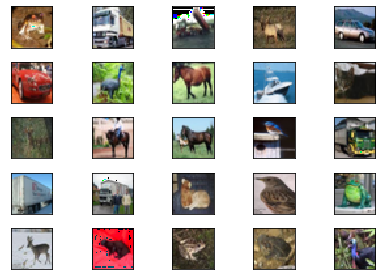

In [3]:
# Load
(train_images, train_labels), (test_images, test_labels) = cifar10.load_data()

print('Training images shape: ', train_images.shape)
print('Number of training samples ', train_images.shape[0])
print('Number of testing samples ', test_images.shape[0])

# Plotting some training images
for i in range(25):
    plt.subplot(5,5, i+1, xticks = [], yticks = [])
    plt.imshow(train_images[i] + 1)
plt.tight_layout()
plt.show()

# Normalize the images to [-1, 1]
train_images = (train_images - 127.5) / 127.5

# Self Attention Block

In [4]:
class SelfAttention(Layer):

    def __init__(self, ch, **kwargs):
        super(SelfAttention, self).__init__(**kwargs)
        self.num_channels = ch
        self.filters_f = self.num_channels // 8
        self.filters_g = self.num_channels // 8
        self.filters_h = self.num_channels
    
    def get_config(self, ch):
        config = super(SelfAttention, self).get_config()
      # config['channels'] = ch
      # base_config['output_dim'] = self.output_dim
        return config

    def build(self, input_shape):
        kernel_shape_f = (1, 1) + (self.num_channels, self.filters_f)
        kernel_shape_g = (1, 1) + (self.num_channels, self.filters_g)
        kernel_shape_h = (1, 1) + (self.num_channels, self.filters_h)

        self.gamma = self.add_weight(name = 'gamma', shape = [1], initializer = 'zeros', trainable = True)

        self.kernel_f = self.add_weight(shape = kernel_shape_f, initializer = initializers.glorot_uniform(123), name = 'kernel_f', trainable = True)
        self.kernel_g = self.add_weight(shape = kernel_shape_g, initializer = initializers.glorot_uniform(123), name = 'kernel_g', trainable = True)
        self.kernel_h = self.add_weight(shape = kernel_shape_h, initializer = initializers.glorot_uniform(123), name = 'kernel_g', trainable = True)

        super(SelfAttention, self).build(input_shape)

        self.input_spec = InputSpec(ndim = 4, axes = {3: input_shape[-1]}) # set input spec.
        self.built = True

    def call(self, x):

        def flatten(x):
            return K.reshape(x, shape = [K.shape(x)[0], K.shape(x)[1]*K.shape(x)[2], K.shape(x)[3]])

        # f (query)
        f = K.conv2d(x, kernel=self.kernel_f, padding='same') # (32, 32, filters = 64) --> (32, 32, 8)
        f = flatten(f) # (1024, 8) 

        # g (key)
        g = K.conv2d(x, kernel=self.kernel_g, padding='same') 
        g = flatten(g) # (1024, 8)

        attention = K.batch_dot(g, K.permute_dimensions(f, (0, 2, 1))) # (1024, 1024)
        attention = K.softmax(attention, axis=-1)    # Attentinon Map
        print(attention)

        # h (value)
        h = K.conv2d(x, kernel=self.kernel_h, padding='same')  #(32, 32, 64)
        h = flatten(h) # (1024, 64)

        attention_h = K.batch_dot(attention, h) # (1024, 64) (64 is the number of filters or channels)
        attention_h = K.reshape(attention_h, shape = K.shape(x)) # (32, 32, 64), we get 64 self-attention feature maps of shape (32, 32)

        x = self.gamma * attention_h + x

        return [x, attention]

    def compute_output_shape(self, input_shape):
        # return [input_shape, (K.shape(input_shape)[1] * K.shape(input_shape)[2], K.shape(input_shape)[1] * K.shape(input_shape)[2])]
        return [input_shape, (1024, 1024)]

In [5]:
num_classes = 10
latent_dim = 100
img_shape = (32, 32,3)

def make_generator_model_SN():
    initializer = initializers.glorot_uniform(seed=123)
    in_x = Input(shape = (latent_dim, ))
    labels = Input(shape=(10,))

    x = Concatenate()([in_x, labels])

    # Dense layer
    x = Dense(2*2*512, use_bias=False, kernel_initializer=initializer)(x) #activation included
    x = BatchNormalization(momentum=0.9, epsilon=1e-5)(x)
    x = Activation('relu')(x)

    x = Reshape((2,2,512))(x)

    # CONV 1: 4x4x256
    x = UpSampling2D((2, 2))(x)
    x = ConvSN2D(256, kernel_size=3, strides=1, padding='same', use_bias=False, kernel_initializer=initializer, name='Conv1')(x)
    x = BatchNormalization(momentum=0.9, epsilon=1e-5)(x)
    x = Activation("relu")(x)

    #  CONV 2: 8x8x128
    x = UpSampling2D((2, 2))(x)
    x = ConvSN2D(128, kernel_size=3, strides=1, padding='same', use_bias=False, kernel_initializer=initializer, name='Conv2')(x)
    x = BatchNormalization(momentum=0.9, epsilon=1e-5)(x)
    x = Activation("relu")(x)

    # CONV 3: 16x16x64
    x = UpSampling2D((2, 2))(x)
    x = ConvSN2D(64, kernel_size=5, strides=1, padding='same', use_bias=False, kernel_initializer=initializer, name='Conv3')(x)
    x = BatchNormalization(momentum=0.9, epsilon=1e-5)(x)
    x = Activation("relu")(x)
    
    # x = google_attention(x, None, 'gattn')
    x, x_map = SelfAttention(ch=64, name='Self_Attention')(x)
    # print(K.shape(x_map[2]))
    # print(x_map)

    # CONV 4: 32x32x3
    x = UpSampling2D((2,2))(x)
    out = ConvSN2D(3, kernel_size=3, strides=1, padding='same', activation='tanh', use_bias=False, kernel_initializer=initializer, name='Out')(x)

    model = Model([in_x, labels], out)

    return model

In [6]:
generator = make_generator_model_SN()

# # Print summary of the model
generator.summary()

Tensor("Self_Attention/Softmax:0", shape=(?, ?, ?), dtype=float32)
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 10)           0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 110)          0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)          

In [7]:
def make_discriminator_model_SN():
    initializer = initializers.glorot_uniform(seed=12)

    input_discriminator = Input(shape=[32, 32, 3])
                                
    x = input_discriminator
    labels = Input(shape=(10,))
    labels_embedded = Dense(32*32*3)(labels)
    labels_embedded = Reshape((32, 32, 3))(labels_embedded)

    x = concatenate([x, labels_embedded])

    # CONV 1: 16x16x64
    x = ConvSN2D(64, kernel_size=4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    x = LeakyReLU(0.3)(x)

    x, x_map = SelfAttention(ch=64, name='Self_Attention')(x)

    # CONV 2: 8x8x128
    x = ConvSN2D(128, kernel_size=4, strides=2, use_bias=False, kernel_initializer=initializer, padding='same')(x)
    # x = BatchNormalization(momentum=0.9, epsilon=1e-5)(x)
    x = LeakyReLU(0.3)(x)

    # CONV 3: 4x4x256
    x = ConvSN2D(256, kernel_size=4, strides=2,  use_bias=False, kernel_initializer=initializer, padding='same')(x)
    # x = BatchNormalization(momentum=0.9, epsilon=1e-5)(x)
    x = LeakyReLU(0.3)(x)

    # CONV 4: 2x2x512
    x = ConvSN2D(512, kernel_size=4, strides=2,  use_bias=False, kernel_initializer=initializer, padding='same')(x)
    # x = BatchNormalization(momentum=0.9, epsilon=1e-5)(x)
    x = LeakyReLU(0.3)(x)

    # CONV 5
    x = ConvSN2D(filters = 1, kernel_size=1, strides=1, padding = 'same', kernel_initializer=initializer, use_bias=False, name='conv5')(x)

    # Fully Connected
    x = Flatten()(x)

    # Classification
    out = DenseSN(1, activation=None, name='out')(x)
    model = Model([input_discriminator, labels], out)

    return model

In [8]:
discriminator = make_discriminator_model_SN()

# decision = discriminator.predict(generated_image)
# print('Output of Untrained discriminator: ', decision, '\n')

# # Print Summary of the discriminator 
discriminator.summary()

Tensor("Self_Attention_1/Softmax:0", shape=(?, ?, ?), dtype=float32)
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 10)           0                                            
__________________________________________________________________________________________________
dense_2 (Dense)                 (None, 3072)         33792       input_4[0][0]                    
__________________________________________________________________________________________________
input_3 (InputLayer)            (None, 32, 32, 3)    0                                            
__________________________________________________________________________________________________
reshape_2 (Reshape)             (None, 32, 32, 3)    0           dense_2[0][0]                    
_______________________


# Optimizers

In [9]:
# #Wasserstein Distance
# def hinge_loss(y_true,y_pred):
#     return K.losses.hinge(t_true,y_pred)

In [10]:
# Generator
generator.compile(Adam(lr=0.0001, beta_1=0.1, beta_2=0.9), loss='hinge', metrics=['accuracy'])

# Discriminator
discriminator.compile(Adam(lr = 0.0004, beta_1=0.1, beta_2=0.9), loss='hinge', metrics=['accuracy'])

### GAN creation

In [11]:
discriminator.trainable=False

inputs = Input(shape=(latent_dim,))
labels = Input(shape=(num_classes, ))

generated_image = generator([inputs, labels])
decision = discriminator([generated_image, labels])
gan = Model(inputs=[inputs, labels], outputs=decision)

gan.summary()

# GAN
gan.compile(Adam(lr=0.0001, beta_1=0.1, beta_2=0.9), loss='hinge', metrics=['accuracy'])

Tensor("model_1/Self_Attention/Softmax:0", shape=(?, ?, ?), dtype=float32)
Tensor("model_2/Self_Attention/Softmax:0", shape=(?, ?, ?), dtype=float32)
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_6 (InputLayer)            (None, 10)           0                                            
__________________________________________________________________________________________________
model_1 (Model)                 (None, 32, 32, 3)    1921924     input_5[0][0]                    
                                                                 input_6[0][0]                    
_________________________________________

# Training

In [12]:
def plot_generated_images(generated_images, epoch):
    plt.figure(figsize=(5,5), num=2)
    gs1 = gridspec.GridSpec(5,5)
    gs1.update(wspace = 0, hspace = 0)

    for i in range(25):
        ax1 = plt.subplot(gs1[i])
        ax1.set_aspect('equal')
        image = generated_images[i, :, :, :]
        image += 1
        image *= 127.5
        fig = plt.imshow(image.astype(np.uint8))
        plt.axis('off')
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)
    plt.savefig('deep-learning/save-images/sagan_generated_image_%d.png' % epoch)
    plt.tight_layout()
    plt.show()

def saveWeights(epoch, generator, discriminator):
    generator.save_weights('deep-learning/save-weights/sagan_generator_epoch_%d.h5' % epoch)
    discriminator.save_weights('deep-learning/save-weights/sagan_discriminator_epoch_%d.h5' % epoch)

In [13]:
# one hot encoding for labels
def one_hot_encode(y):
    z = np.zeros((len(y), 10))
    idx = np.arange(len(y))
    z[idx, y] = 1
    return z

In [14]:
# Batch size during training
batch_size = 256
tensorboard = TensorBoard(log_dir='deep-learning/log/cifar10_cond_hingegan_wt_clip',histogram_freq=0,batch_size=batch_size,write_graph=True,write_grads=True)
tensorboard.set_model(gan)

number_of_batches = train_images.shape[0]//batch_size
train_labels_encoded = one_hot_encode(train_labels[:,])
test_labels_encoded = one_hot_encode(test_labels[:,])

# Number of training epochs
num_epochs = 250

# Establish convention for real and fake labels during training
real_labels = np.ones(shape=(batch_size, 1)) # 1
fake_labels = np.zeros(shape=(batch_size, 1)) # 0

# Losses to keep track of
D_losses = np.empty(shape=1)
G_losses = np.empty(shape=1)
batches = np.empty(shape=1)


current_batch = 0
clip_value= 0.01

  0%|          | 0/195 [00:00<?, ?it/s]

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



100%|██████████| 195/195 [00:39<00:00,  4.99it/s]

Discriminator loss:0.742 , Generator loss: 1.561  , Epoch: 0


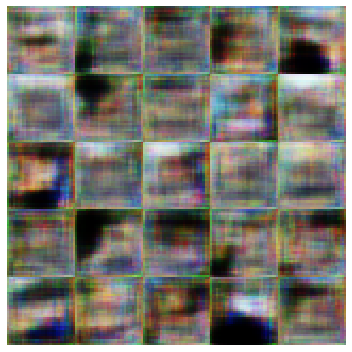

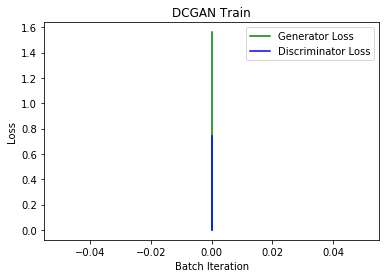

100%|██████████| 195/195 [00:28<00:00,  6.89it/s]


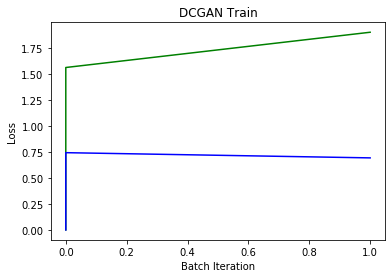

100%|██████████| 195/195 [00:28<00:00,  6.91it/s]


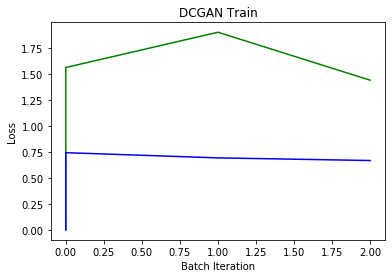

100%|██████████| 195/195 [00:28<00:00,  6.91it/s]


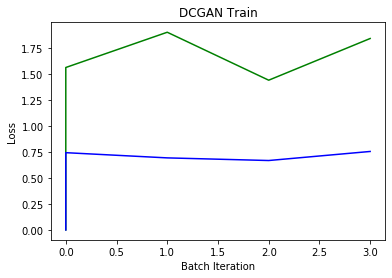

100%|██████████| 195/195 [00:28<00:00,  6.84it/s]


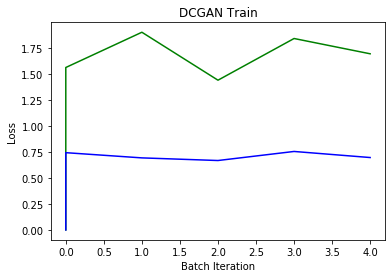

100%|██████████| 195/195 [00:28<00:00,  6.84it/s]


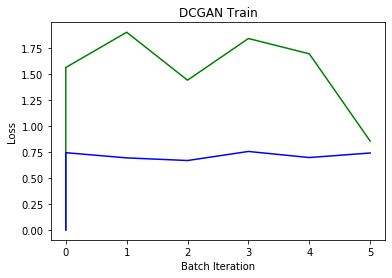

100%|██████████| 195/195 [00:28<00:00,  6.85it/s]


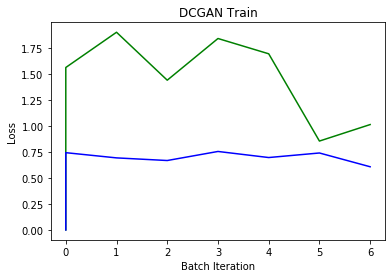

100%|██████████| 195/195 [00:28<00:00,  6.85it/s]


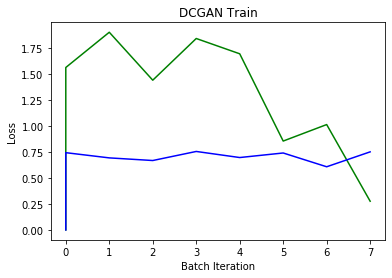

100%|██████████| 195/195 [00:28<00:00,  6.83it/s]


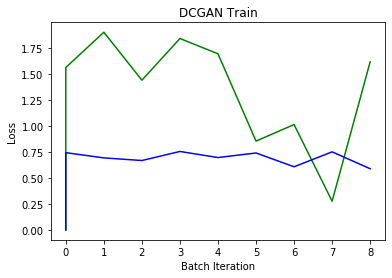

100%|██████████| 195/195 [00:28<00:00,  6.84it/s]


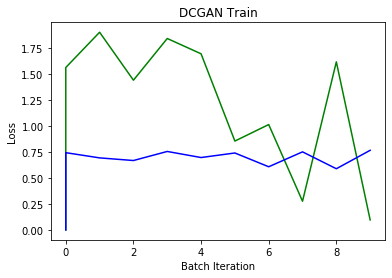

100%|██████████| 195/195 [00:28<00:00,  6.83it/s]


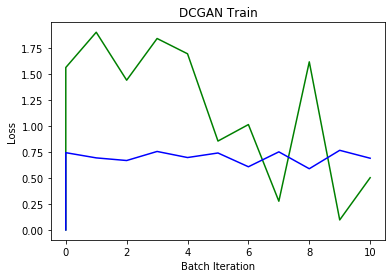

100%|██████████| 195/195 [00:28<00:00,  6.90it/s]


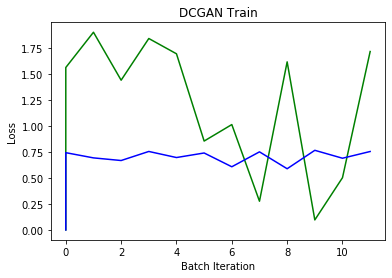

100%|██████████| 195/195 [00:28<00:00,  6.90it/s]


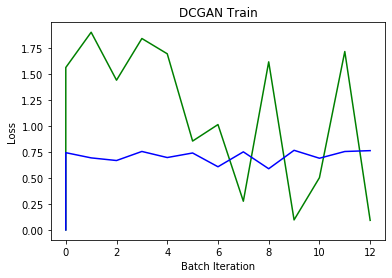

100%|██████████| 195/195 [00:28<00:00,  6.91it/s]


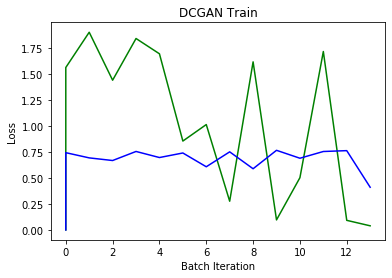

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


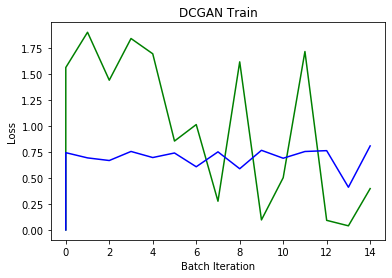

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


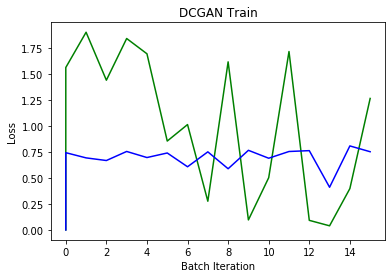

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


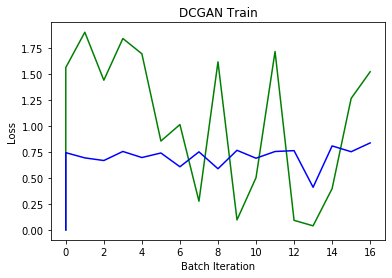

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


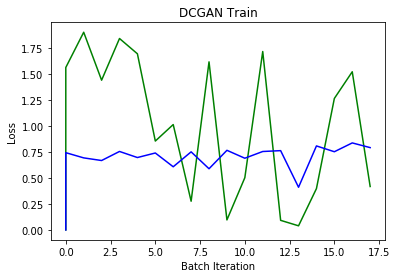

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


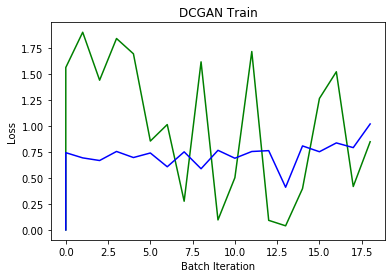

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


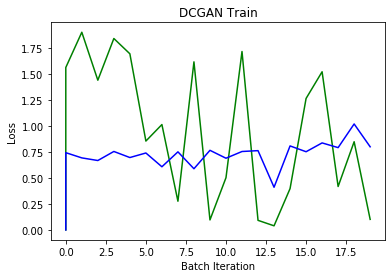

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


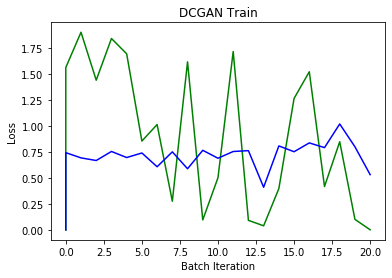

100%|██████████| 195/195 [00:28<00:00,  6.91it/s]


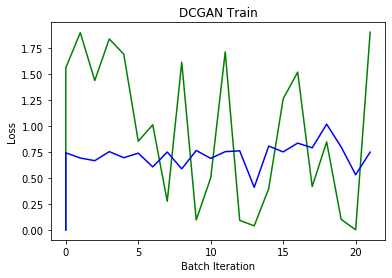

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


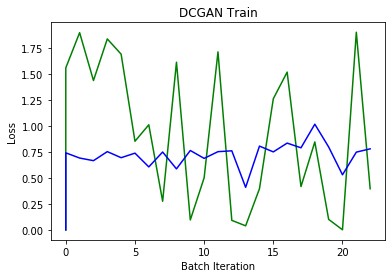

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


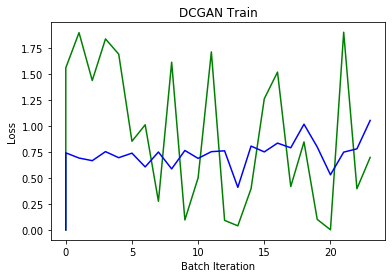

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


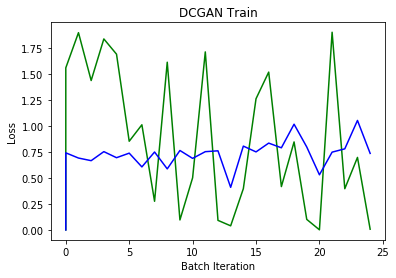

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


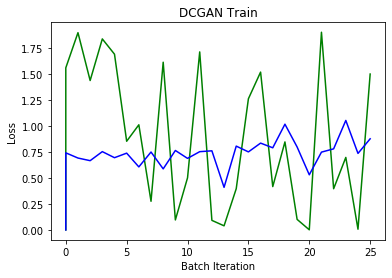

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


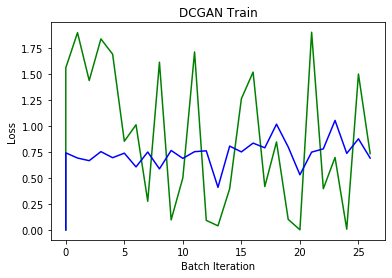

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


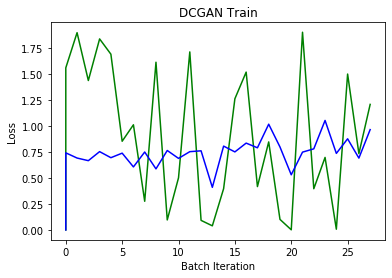

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


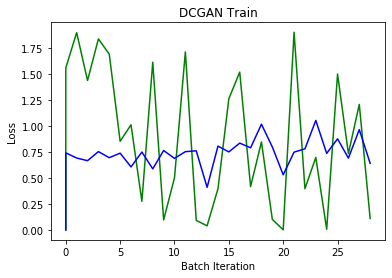

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


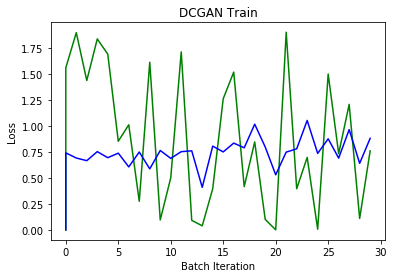

100%|██████████| 195/195 [00:27<00:00,  7.00it/s]


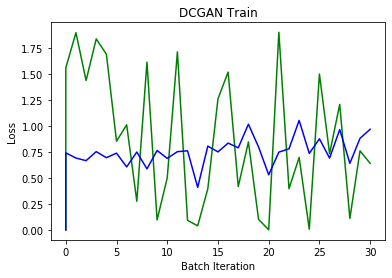

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


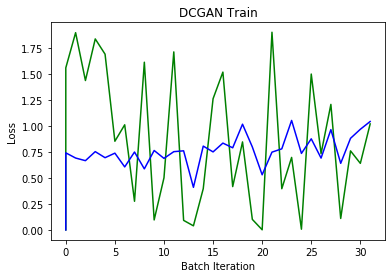

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


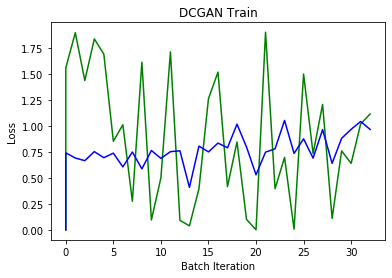

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


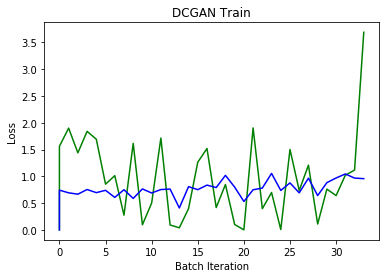

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


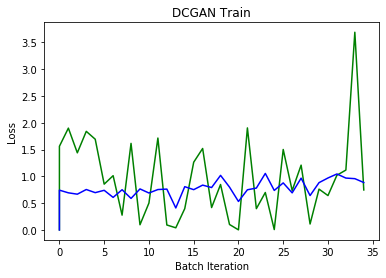

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


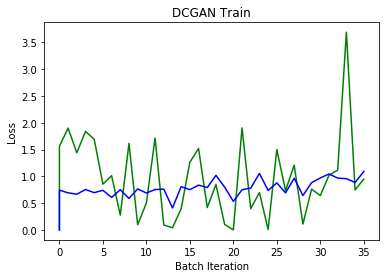

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


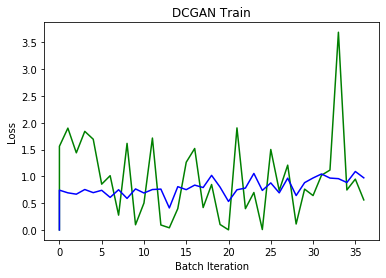

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


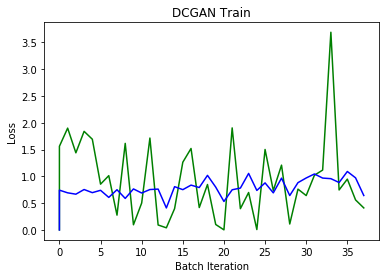

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


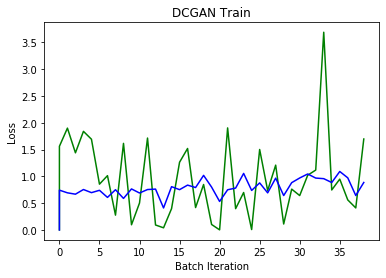

100%|██████████| 195/195 [00:27<00:00,  7.00it/s]


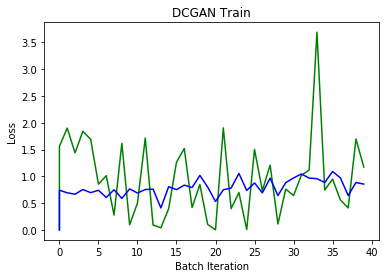

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


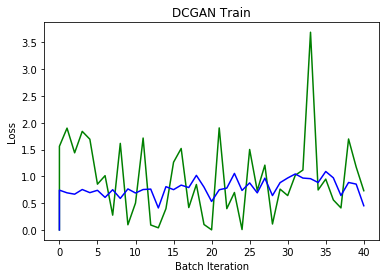

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


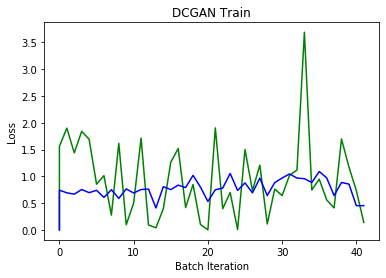

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


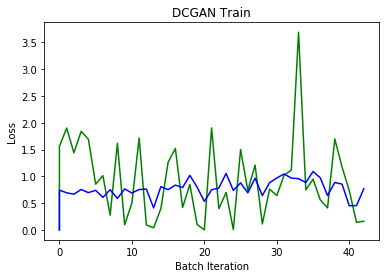

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


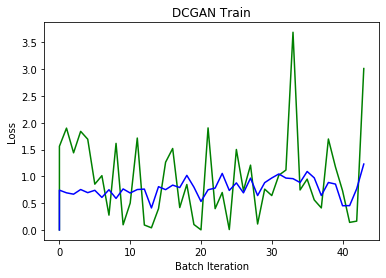

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


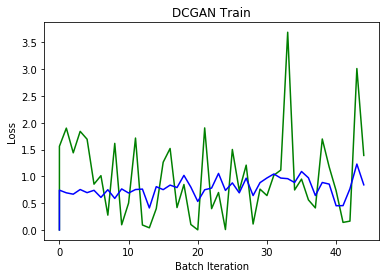

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


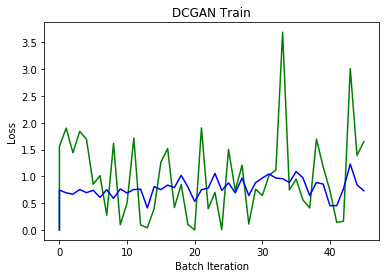

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


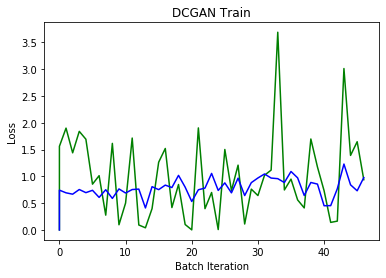

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


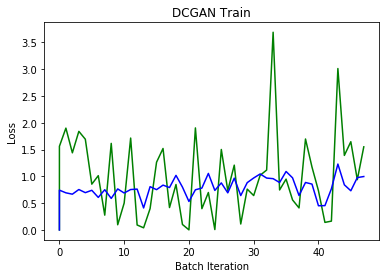

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


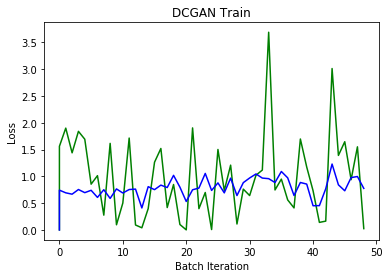

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


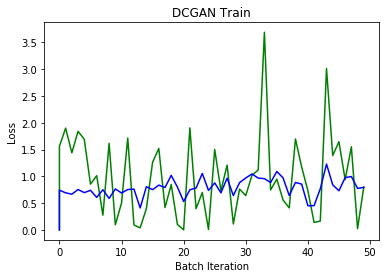

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


Discriminator loss:0.935 , Generator loss: 0.649  , Epoch: 50


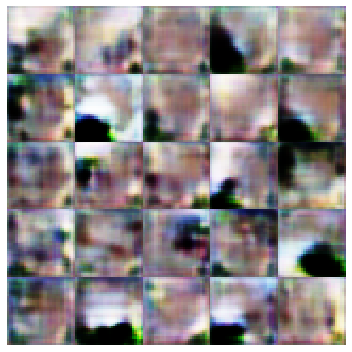

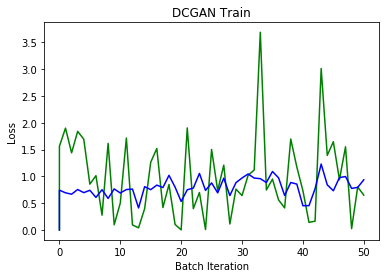

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


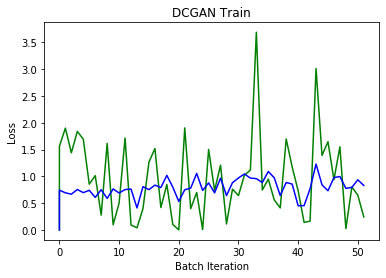

100%|██████████| 195/195 [00:28<00:00,  6.93it/s]


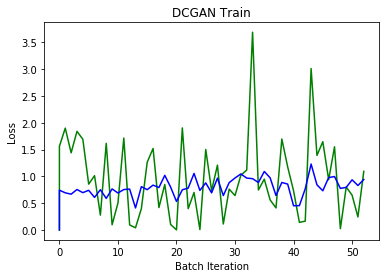

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


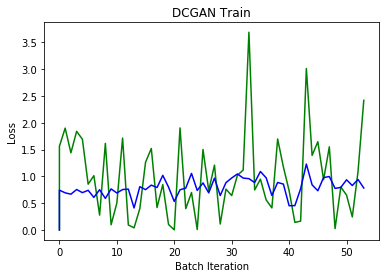

100%|██████████| 195/195 [00:28<00:00,  6.90it/s]


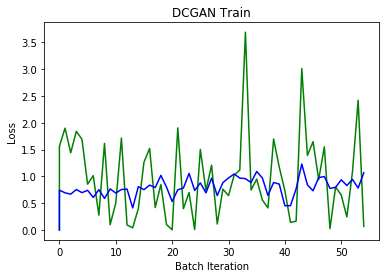

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


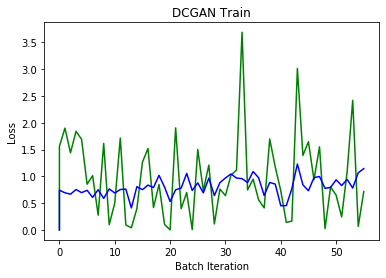

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


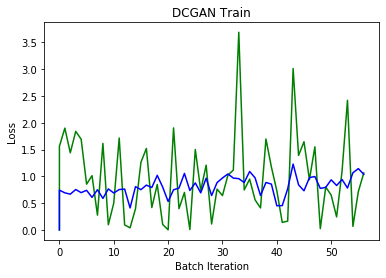

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


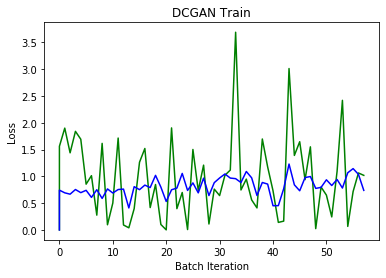

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


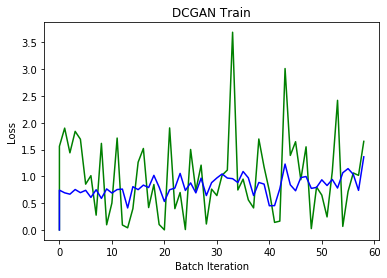

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


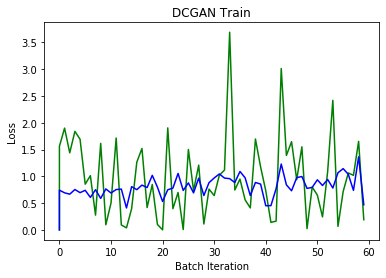

100%|██████████| 195/195 [00:28<00:00,  6.93it/s]


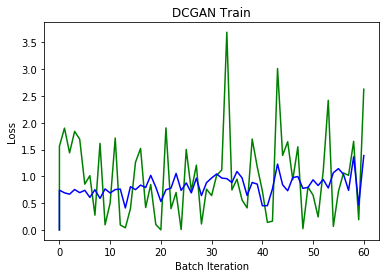

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


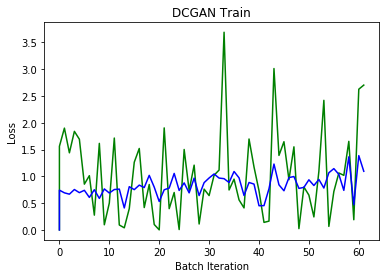

100%|██████████| 195/195 [00:28<00:00,  6.93it/s]


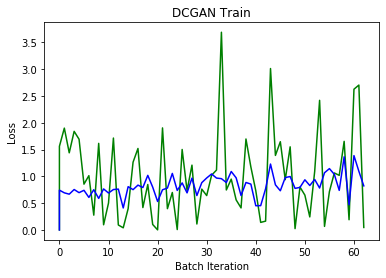

100%|██████████| 195/195 [00:28<00:00,  6.90it/s]


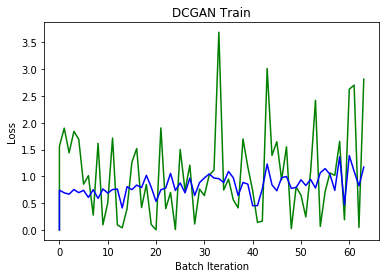

100%|██████████| 195/195 [00:28<00:00,  6.93it/s]


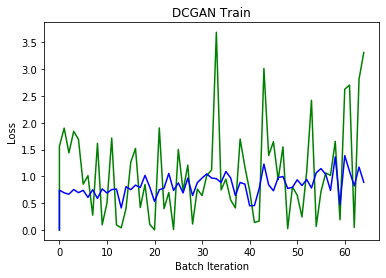

100%|██████████| 195/195 [00:28<00:00,  6.87it/s]


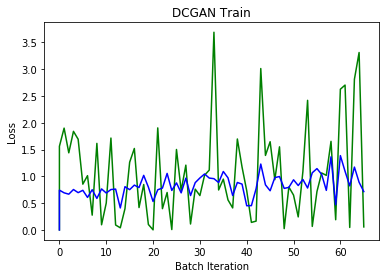

100%|██████████| 195/195 [00:28<00:00,  6.93it/s]


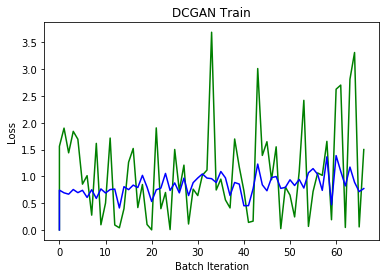

100%|██████████| 195/195 [00:28<00:00,  6.91it/s]


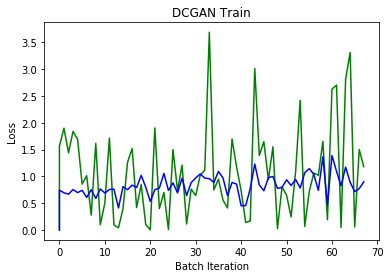

100%|██████████| 195/195 [00:28<00:00,  6.89it/s]


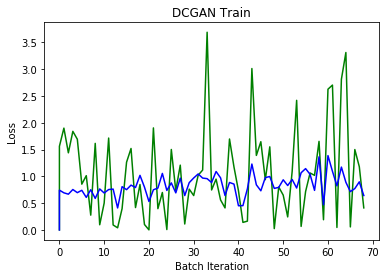

100%|██████████| 195/195 [00:28<00:00,  6.90it/s]


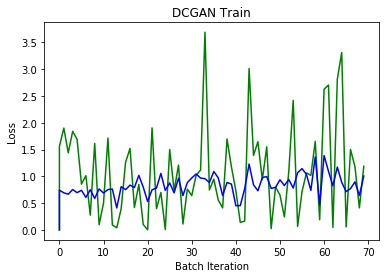

100%|██████████| 195/195 [00:28<00:00,  6.92it/s]


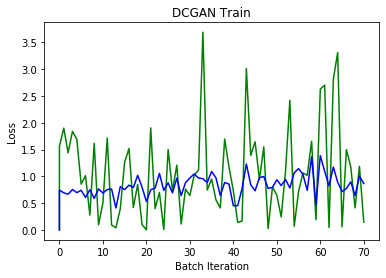

100%|██████████| 195/195 [00:28<00:00,  6.91it/s]


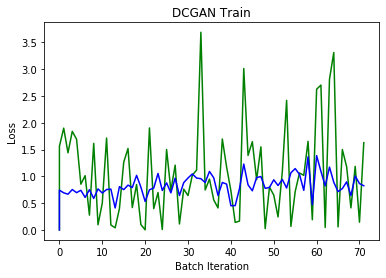

100%|██████████| 195/195 [00:28<00:00,  6.90it/s]


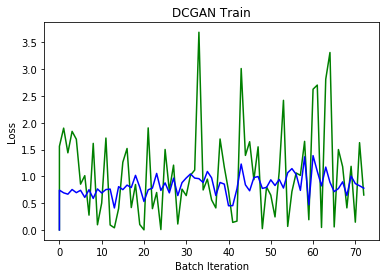

100%|██████████| 195/195 [00:28<00:00,  6.91it/s]


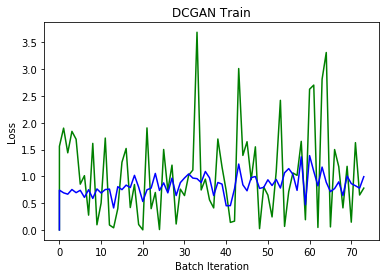

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


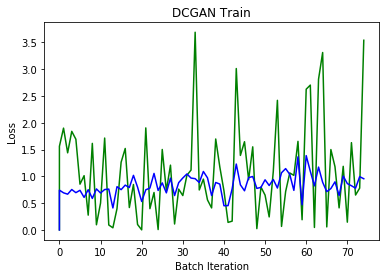

100%|██████████| 195/195 [00:28<00:00,  6.93it/s]


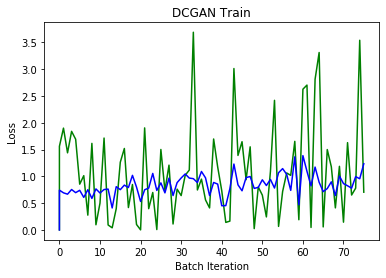

100%|██████████| 195/195 [00:28<00:00,  6.88it/s]


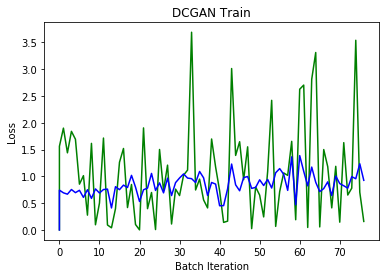

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


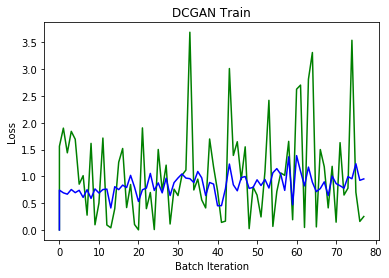

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


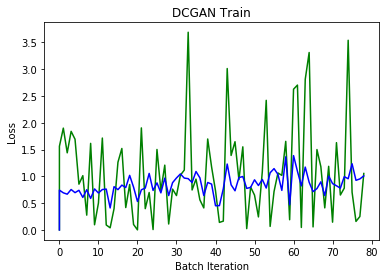

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


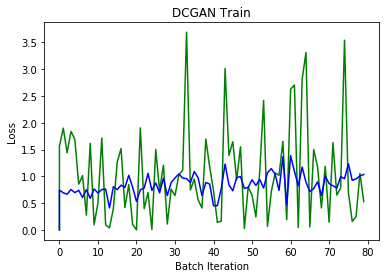

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


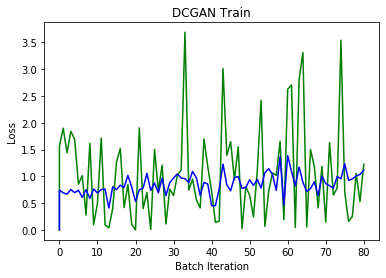

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


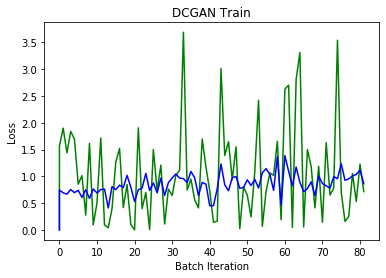

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


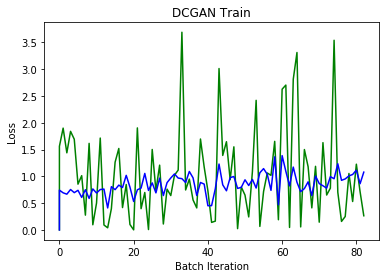

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


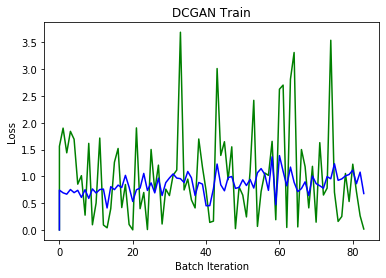

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


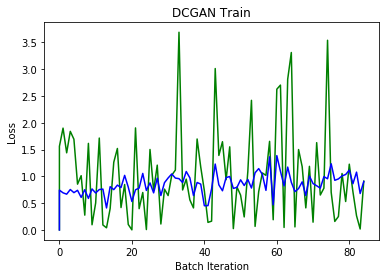

100%|██████████| 195/195 [00:27<00:00,  7.00it/s]


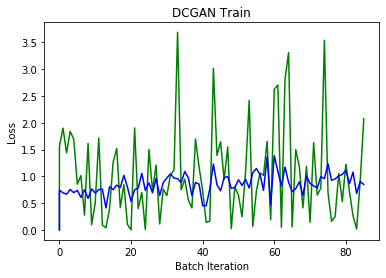

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


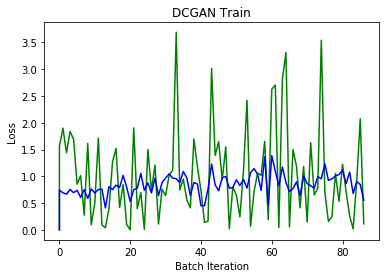

100%|██████████| 195/195 [00:28<00:00,  6.91it/s]


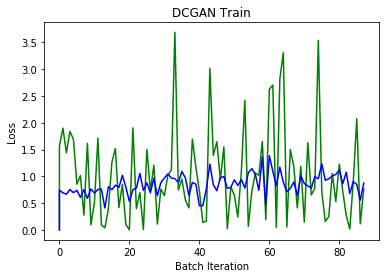

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


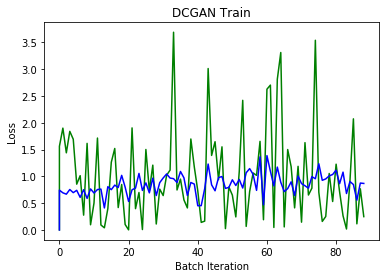

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


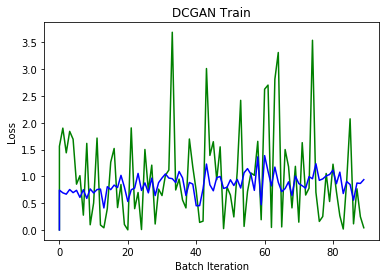

100%|██████████| 195/195 [00:27<00:00,  7.00it/s]


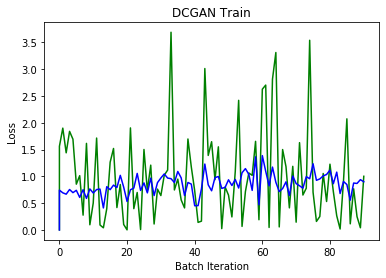

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


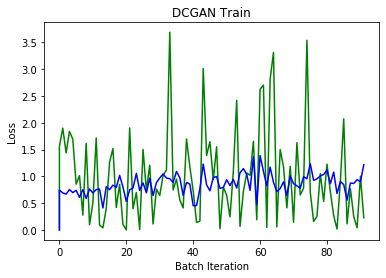

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


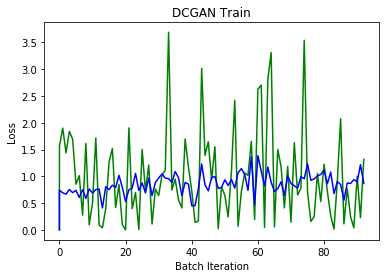

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


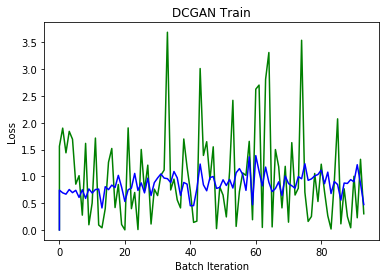

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


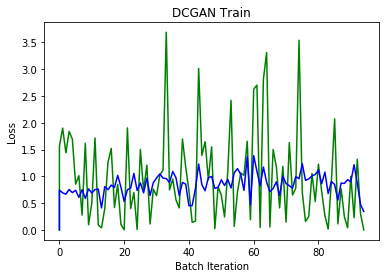

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


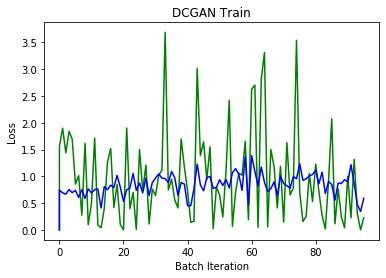

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


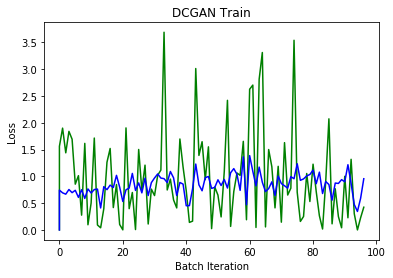

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


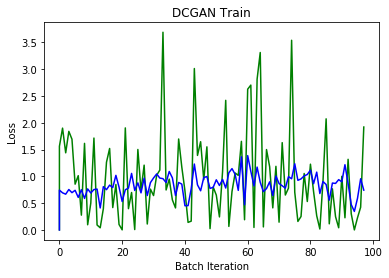

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


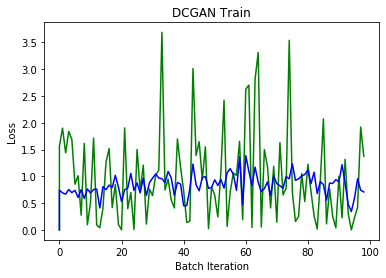

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


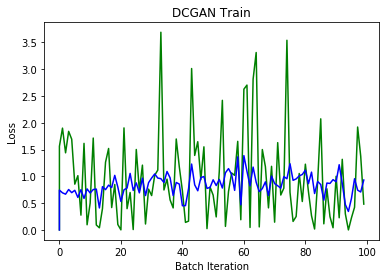

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


Discriminator loss:0.702 , Generator loss: 1.483  , Epoch: 100


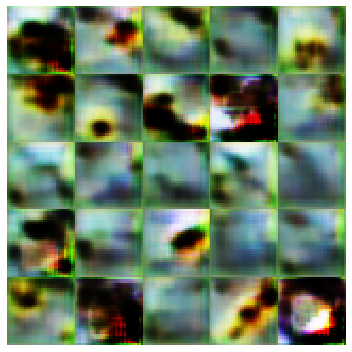

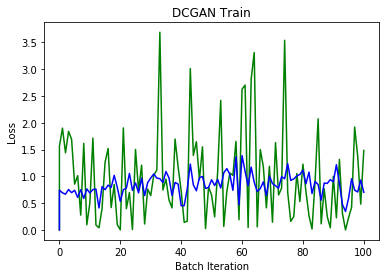

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


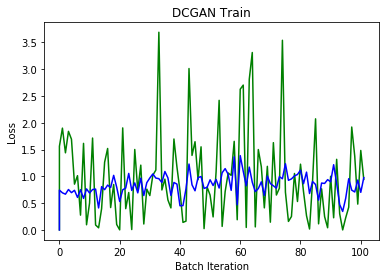

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


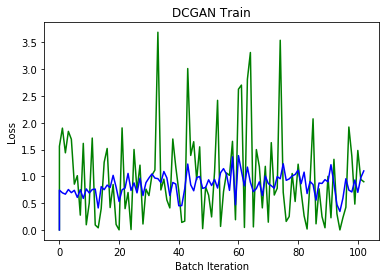

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


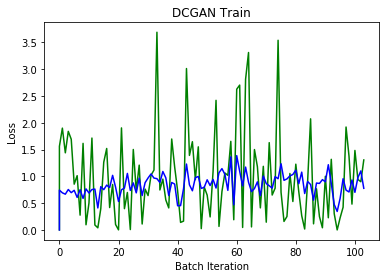

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


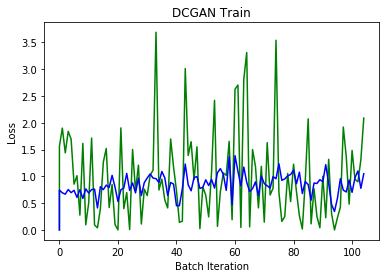

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


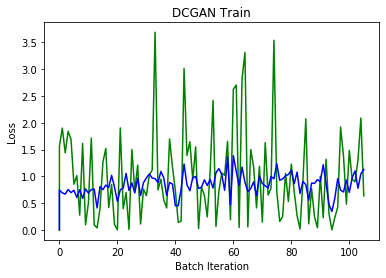

100%|██████████| 195/195 [00:27<00:00,  7.00it/s]


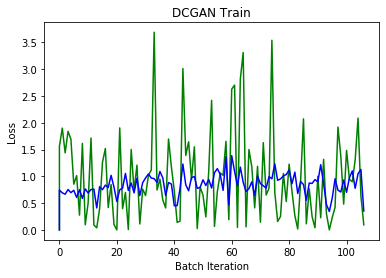

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


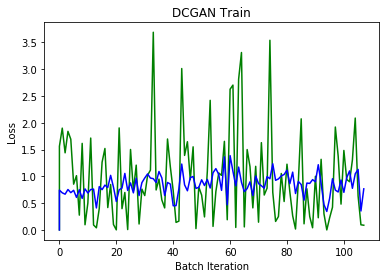

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


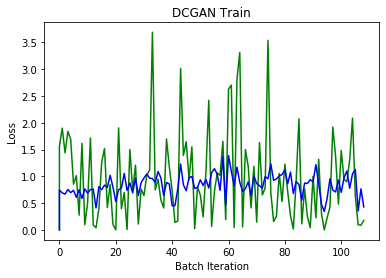

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


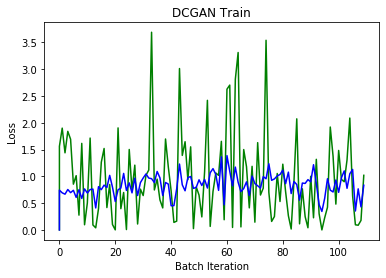

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


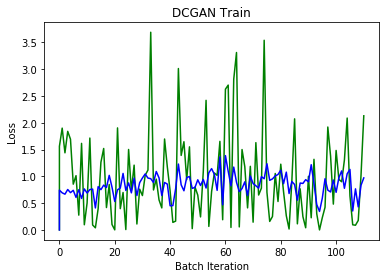

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


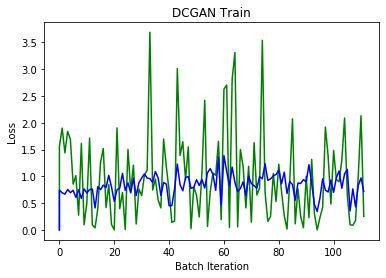

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


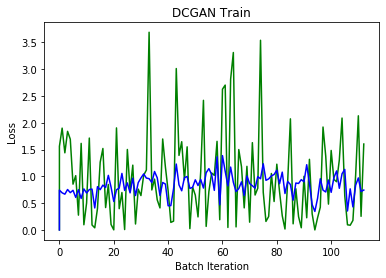

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


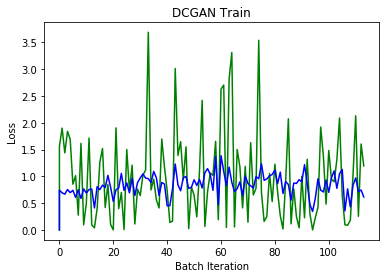

100%|██████████| 195/195 [00:28<00:00,  6.88it/s]


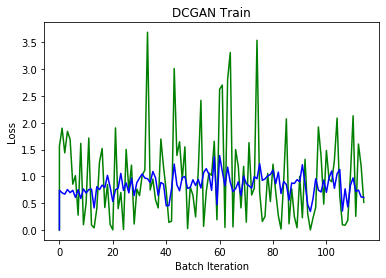

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


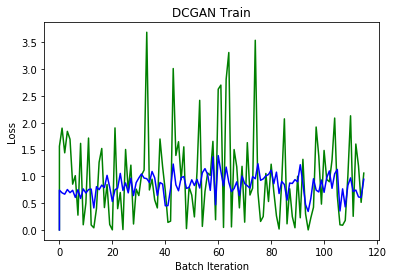

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


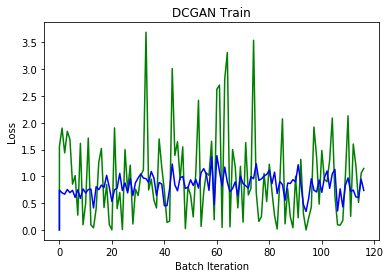

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


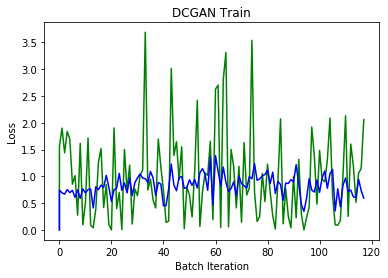

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


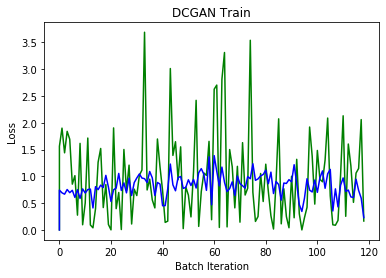

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


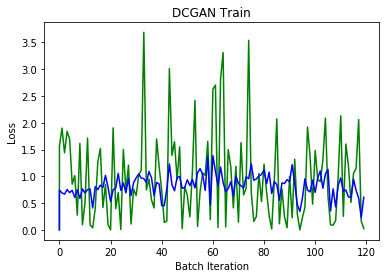

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


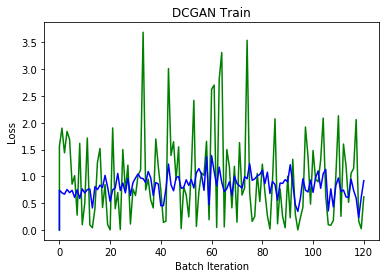

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


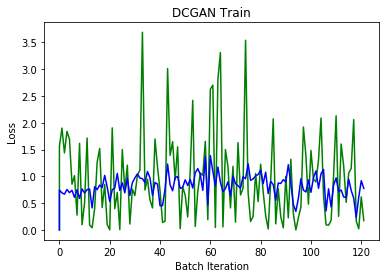

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


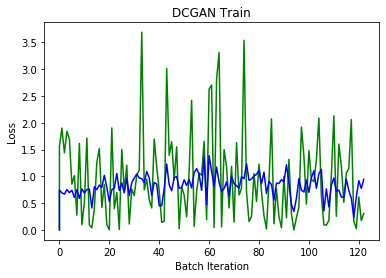

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


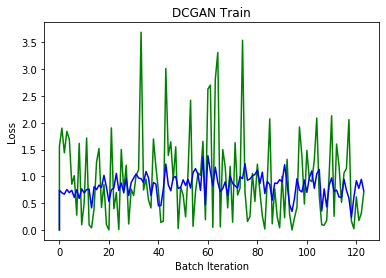

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


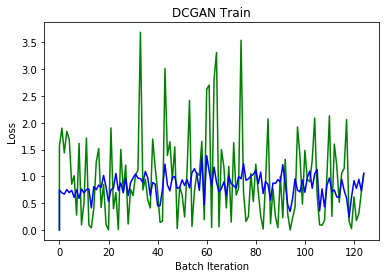

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


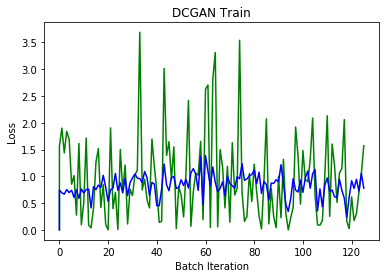

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


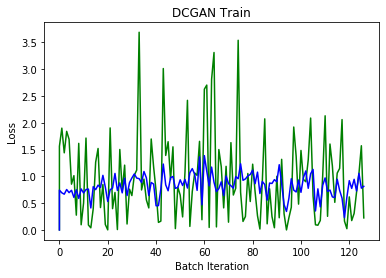

100%|██████████| 195/195 [00:27<00:00,  7.07it/s]


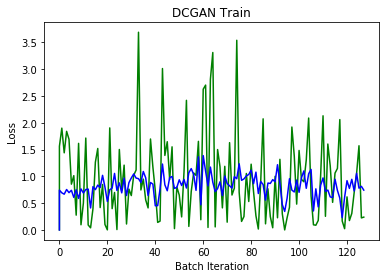

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


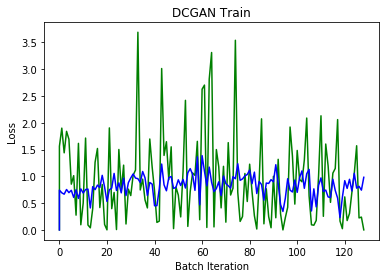

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


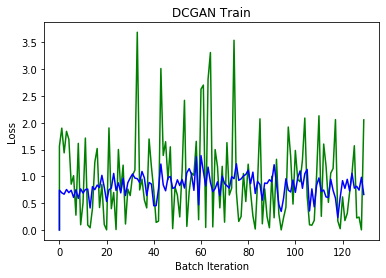

100%|██████████| 195/195 [00:27<00:00,  7.07it/s]


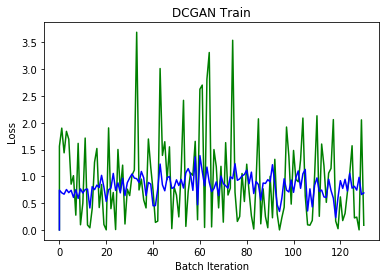

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


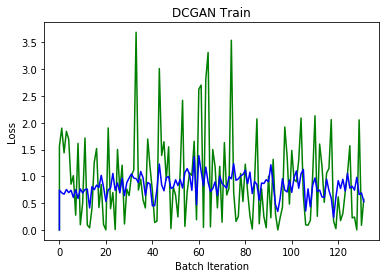

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


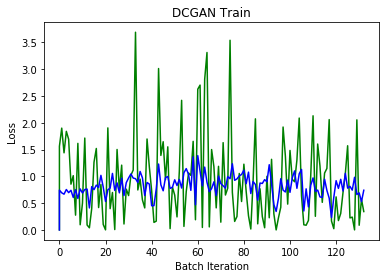

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


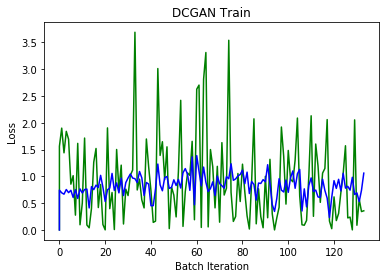

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


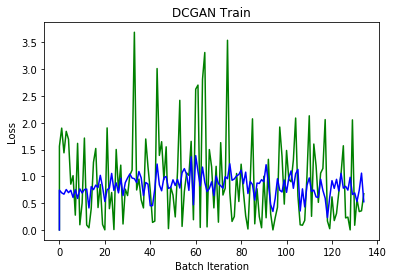

100%|██████████| 195/195 [00:27<00:00,  7.00it/s]


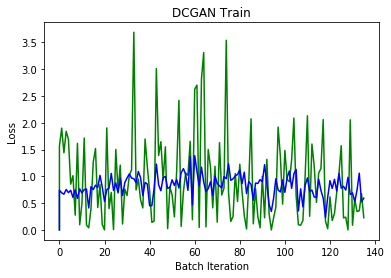

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


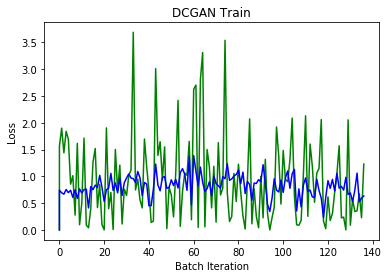

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


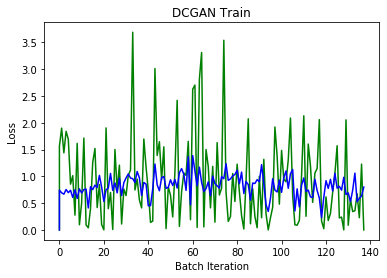

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


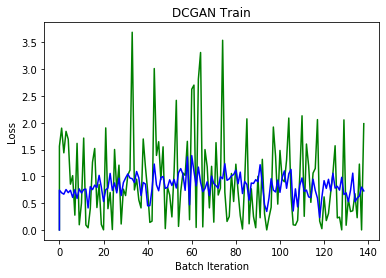

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


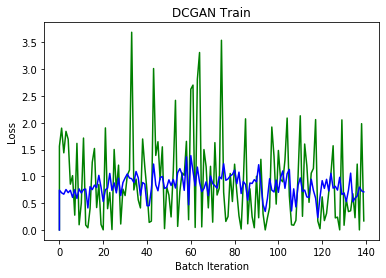

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


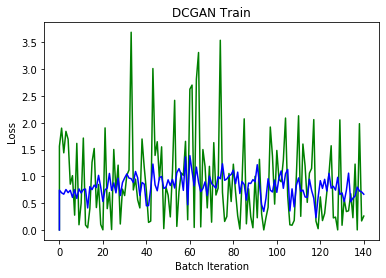

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


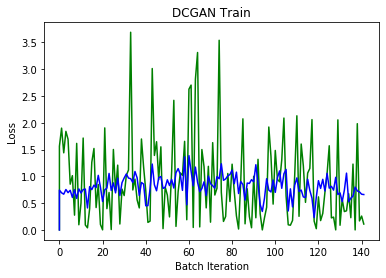

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


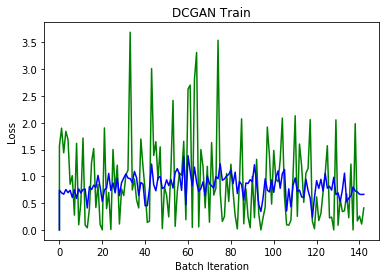

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


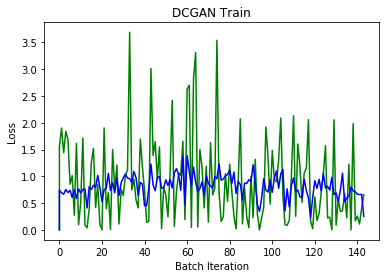

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


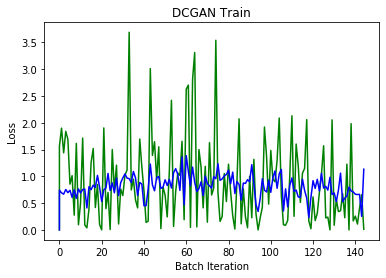

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


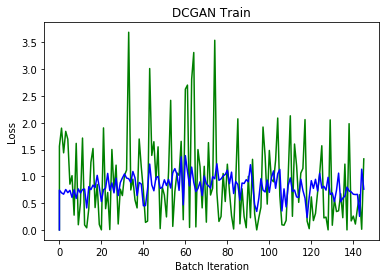

100%|██████████| 195/195 [00:27<00:00,  7.07it/s]


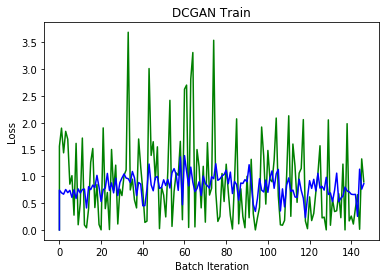

100%|██████████| 195/195 [00:27<00:00,  7.07it/s]


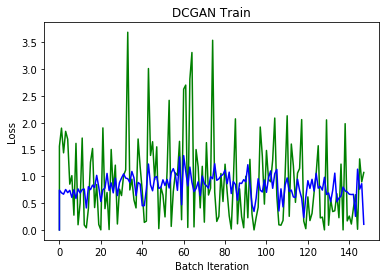

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


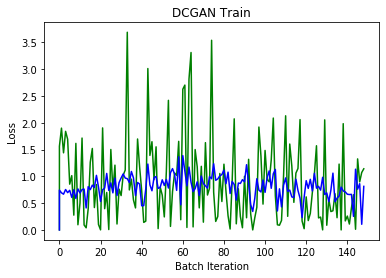

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


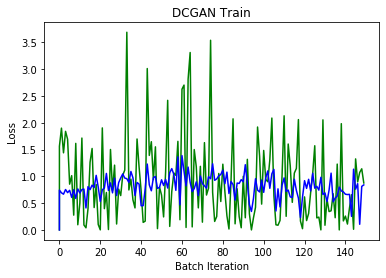

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


Discriminator loss:0.780 , Generator loss: 0.244  , Epoch: 150


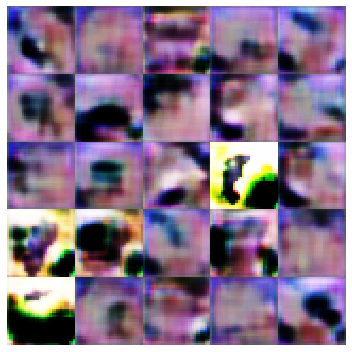

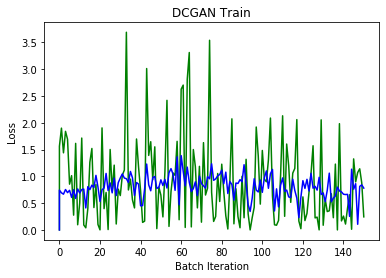

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


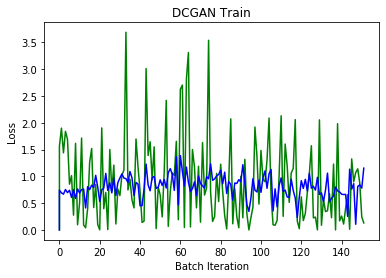

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


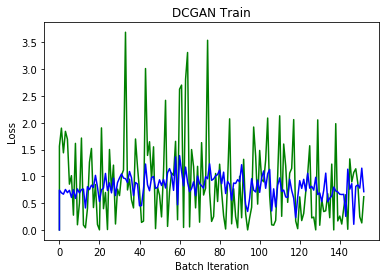

100%|██████████| 195/195 [00:28<00:00,  6.93it/s]


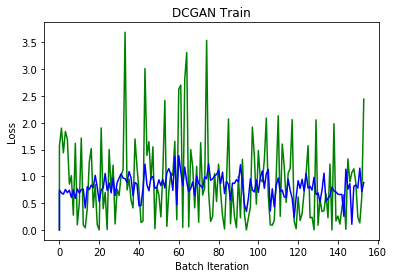

100%|██████████| 195/195 [00:28<00:00,  6.92it/s]


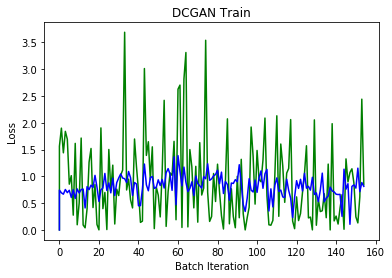

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


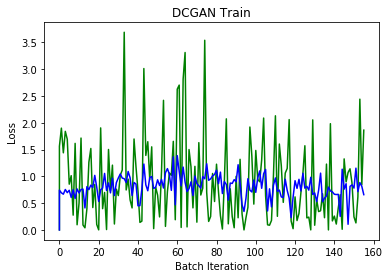

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


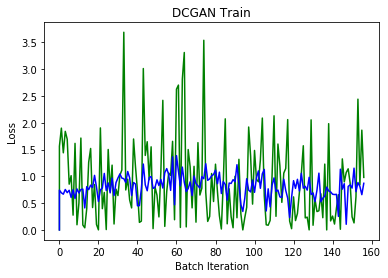

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


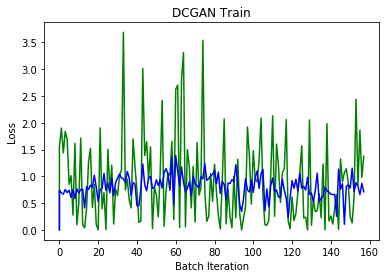

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


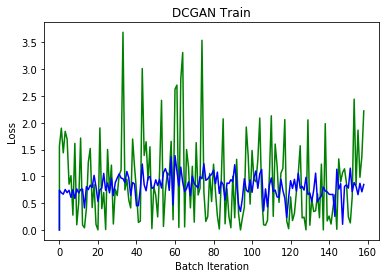

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


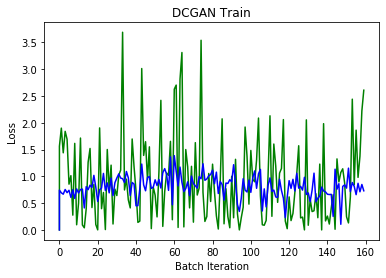

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


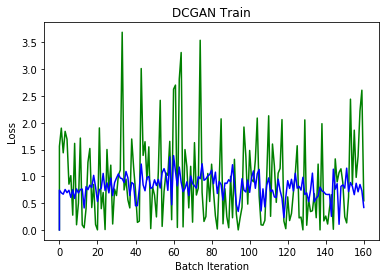

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


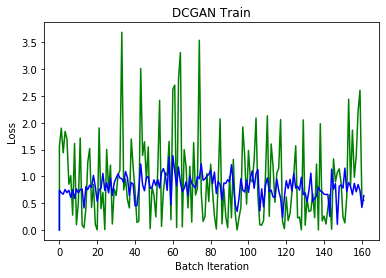

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


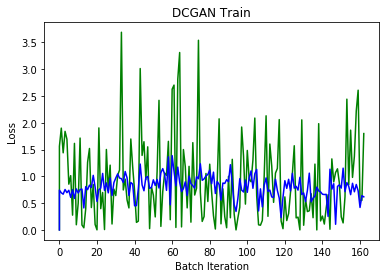

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


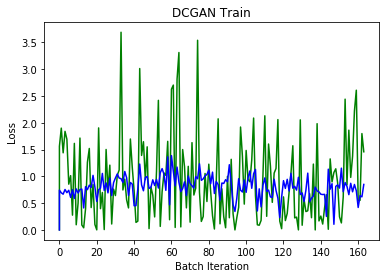

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


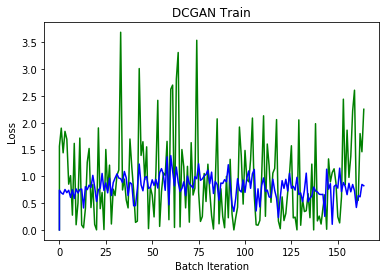

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


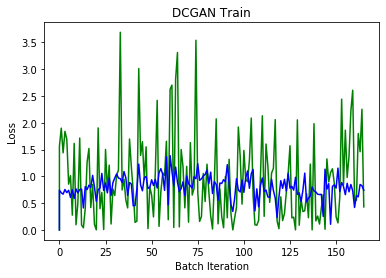

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


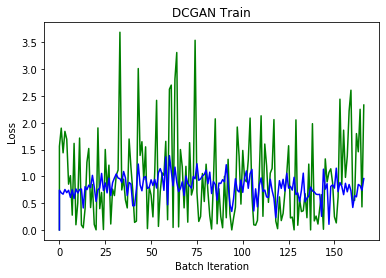

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


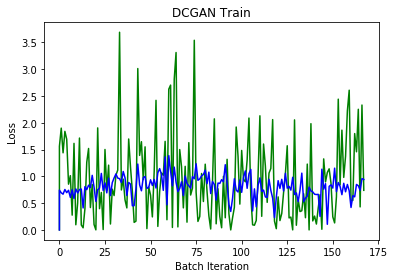

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


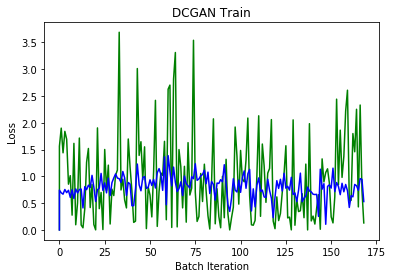

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


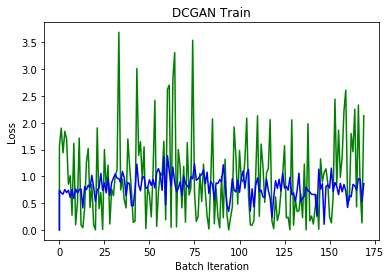

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


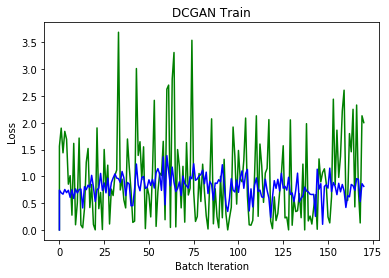

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


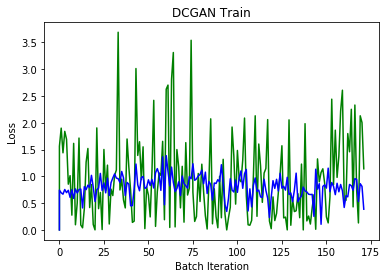

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


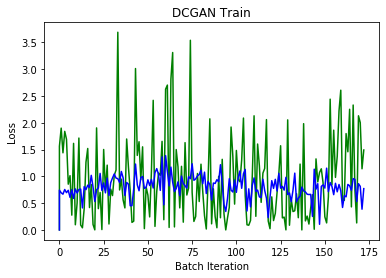

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


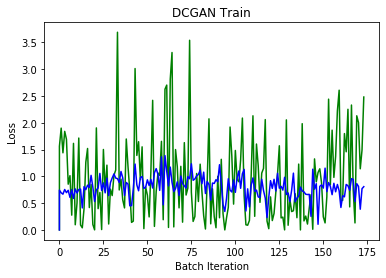

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


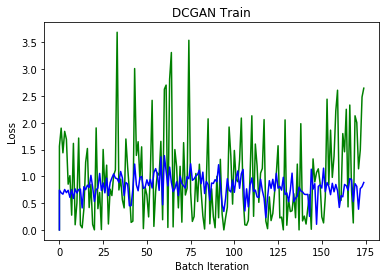

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


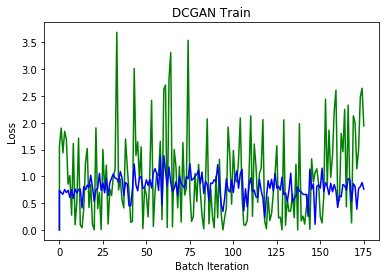

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


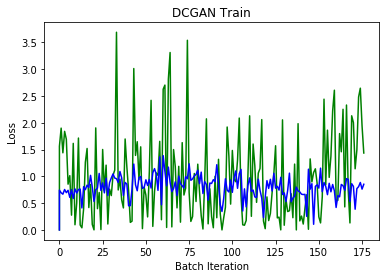

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


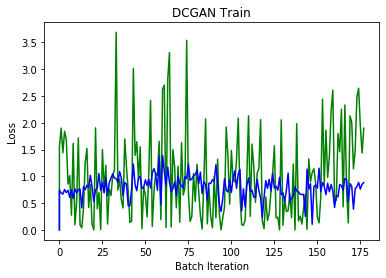

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


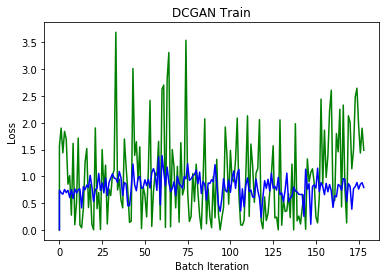

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


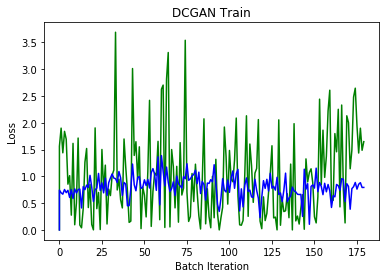

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


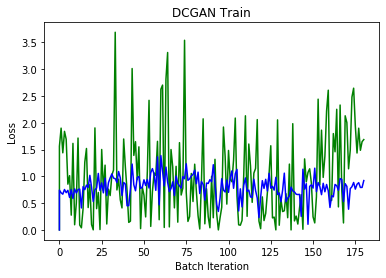

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


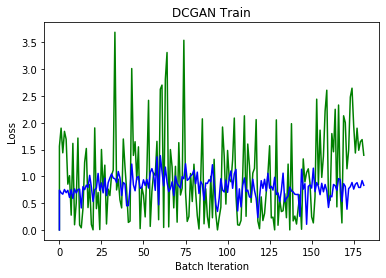

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


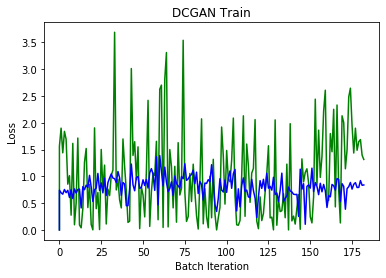

100%|██████████| 195/195 [00:28<00:00,  6.96it/s]


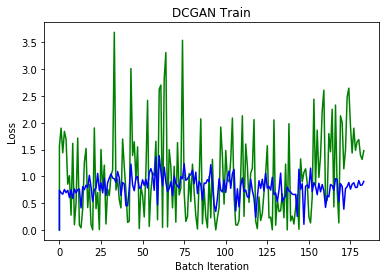

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


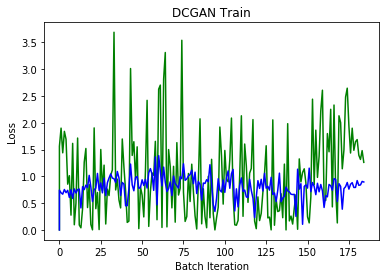

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


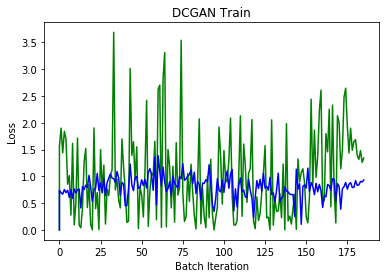

100%|██████████| 195/195 [00:28<00:00,  6.95it/s]


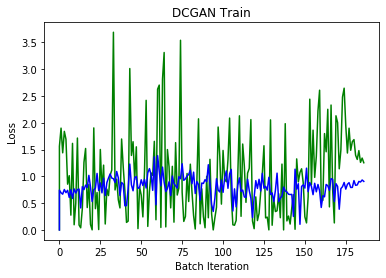

100%|██████████| 195/195 [00:28<00:00,  6.93it/s]


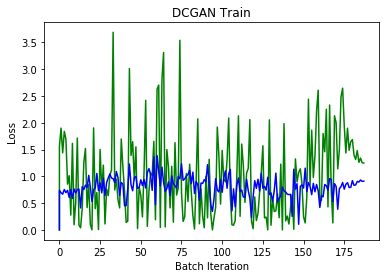

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


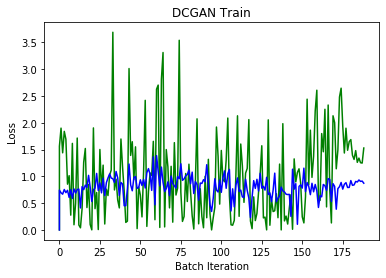

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


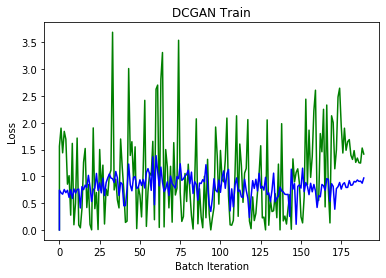

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


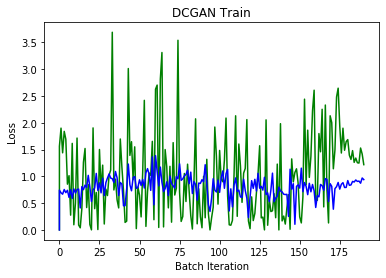

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


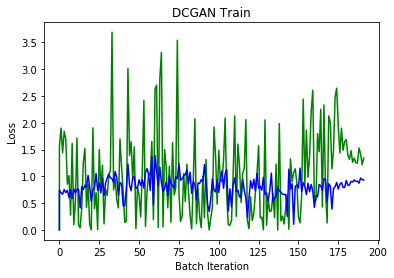

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


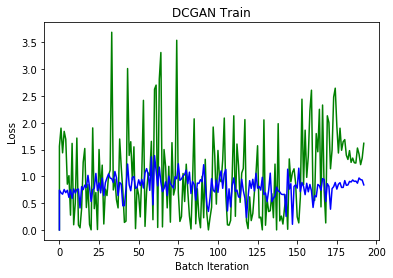

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


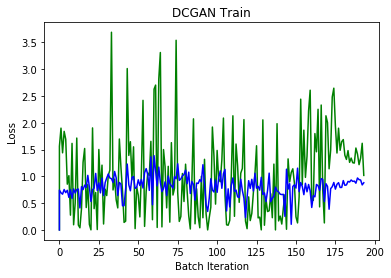

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


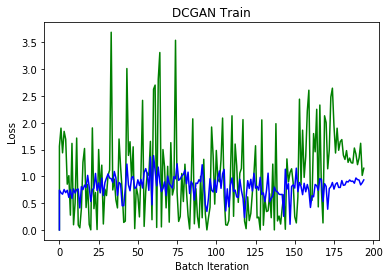

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


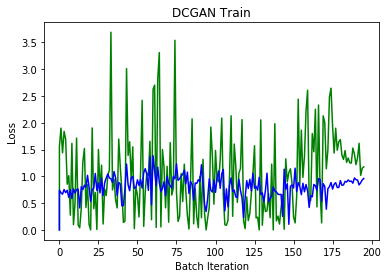

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


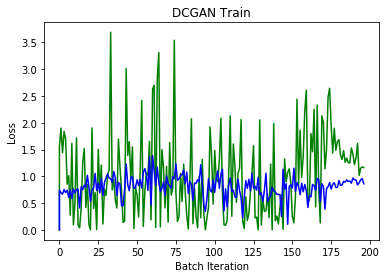

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


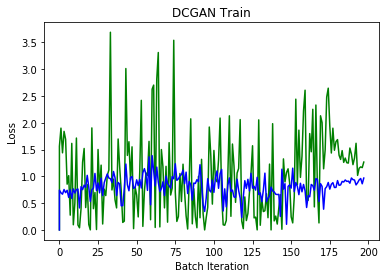

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


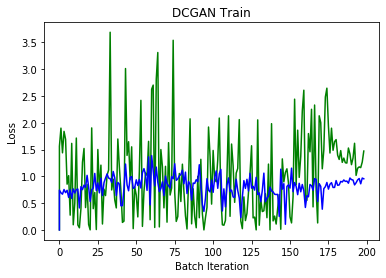

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


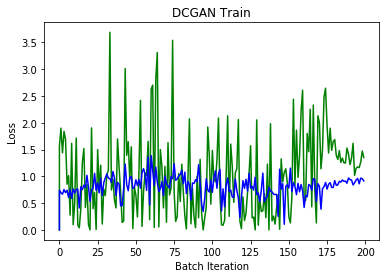

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


Discriminator loss:1.060 , Generator loss: 1.503  , Epoch: 200


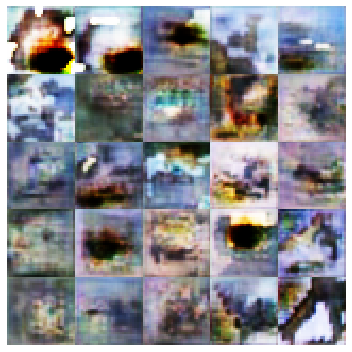

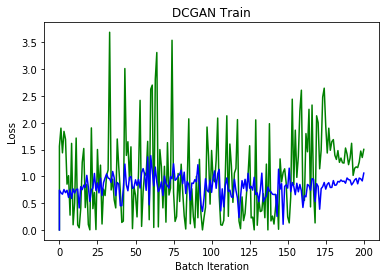

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


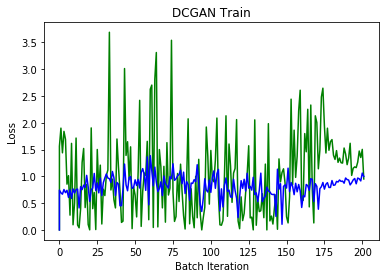

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


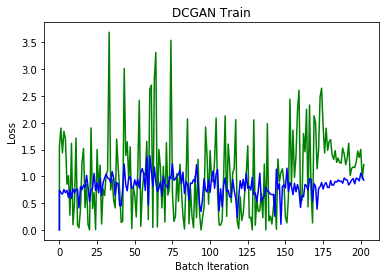

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


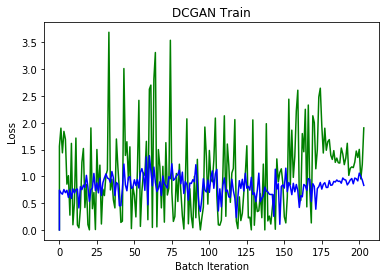

100%|██████████| 195/195 [00:27<00:00,  7.00it/s]


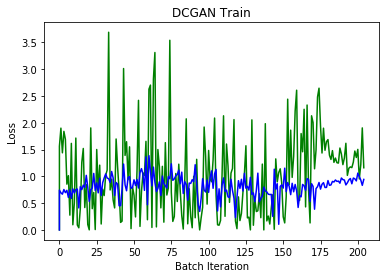

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


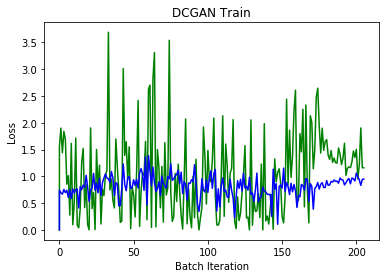

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


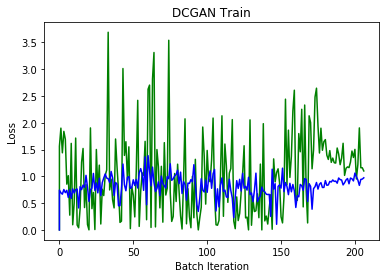

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


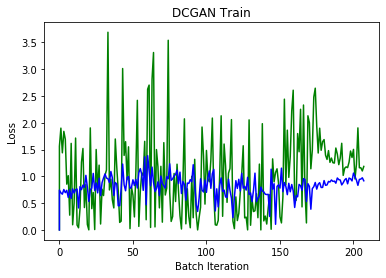

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


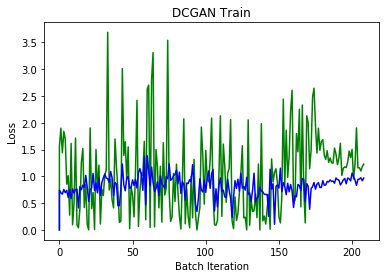

100%|██████████| 195/195 [00:28<00:00,  6.94it/s]


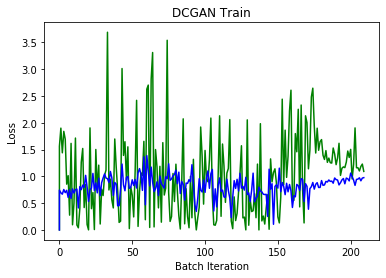

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


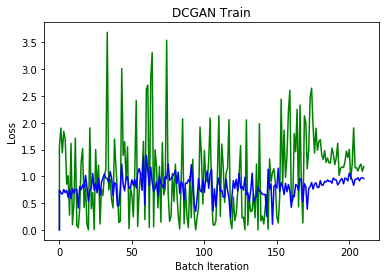

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


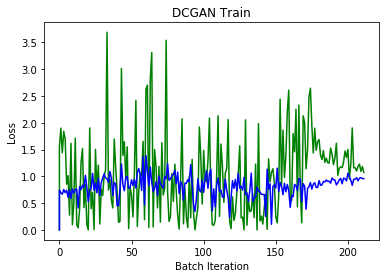

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


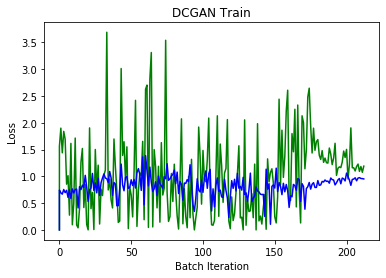

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


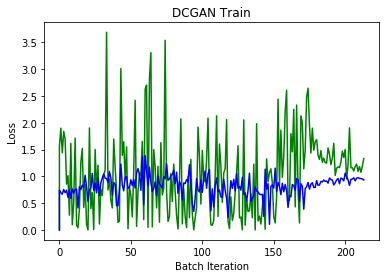

100%|██████████| 195/195 [00:27<00:00,  7.07it/s]


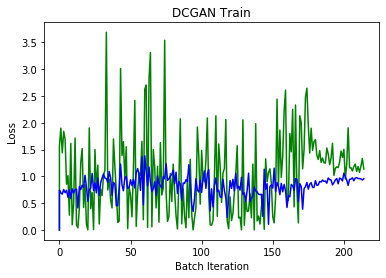

100%|██████████| 195/195 [00:27<00:00,  7.04it/s]


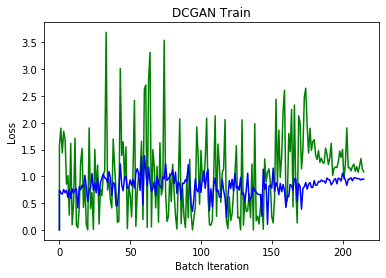

100%|██████████| 195/195 [00:27<00:00,  7.07it/s]


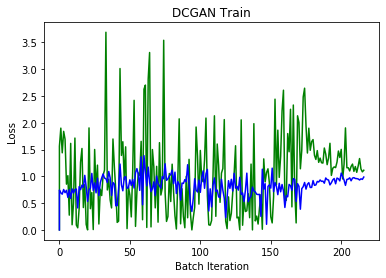

100%|██████████| 195/195 [00:27<00:00,  7.07it/s]


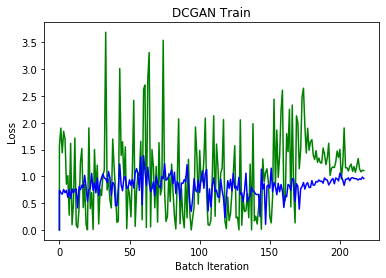

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


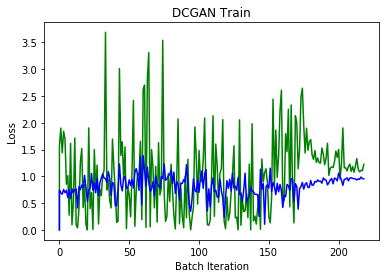

100%|██████████| 195/195 [00:27<00:00,  7.08it/s]


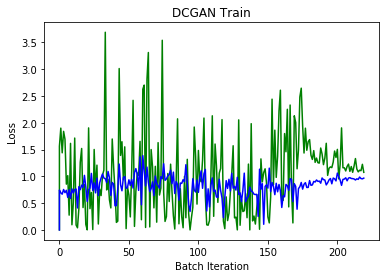

100%|██████████| 195/195 [00:27<00:00,  7.00it/s]


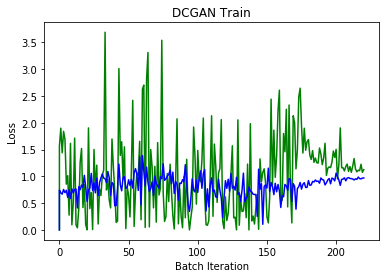

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


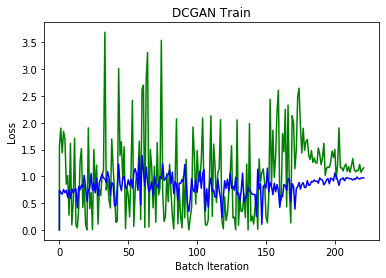

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


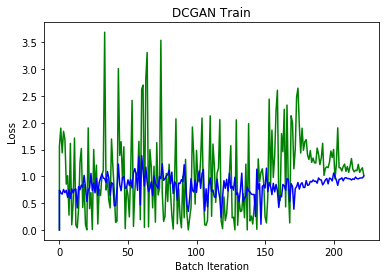

100%|██████████| 195/195 [00:27<00:00,  7.07it/s]


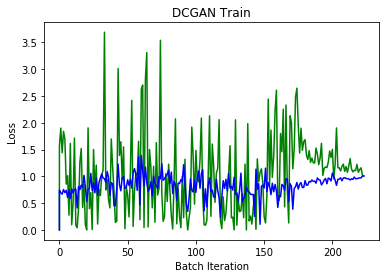

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


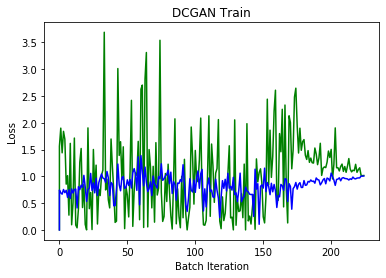

100%|██████████| 195/195 [00:27<00:00,  7.06it/s]


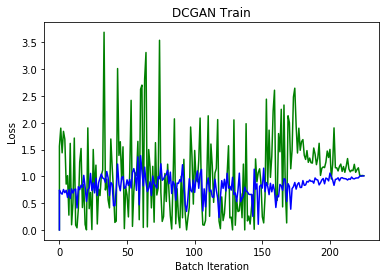

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


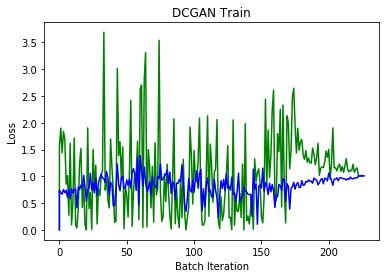

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


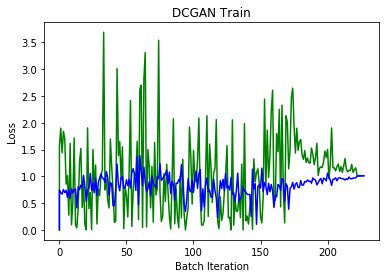

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


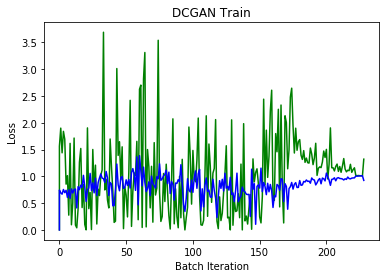

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


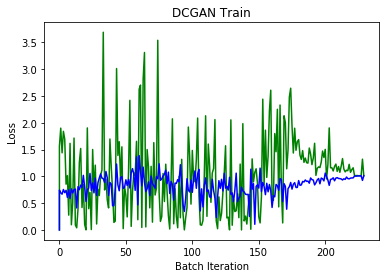

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


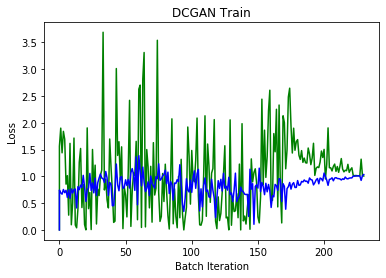

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


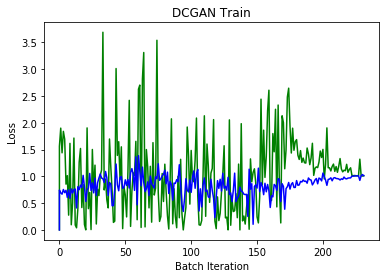

100%|██████████| 195/195 [00:27<00:00,  7.01it/s]


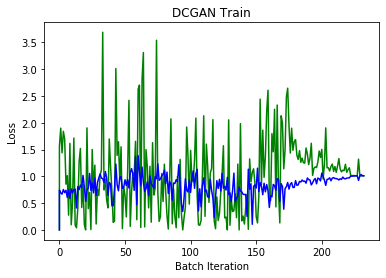

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


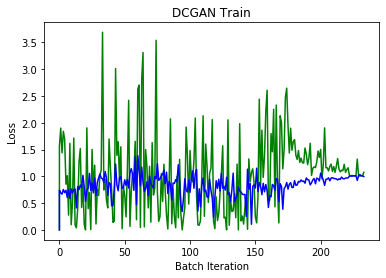

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


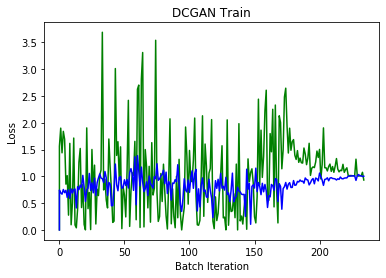

100%|██████████| 195/195 [00:27<00:00,  7.03it/s]


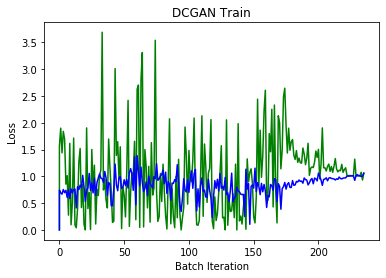

100%|██████████| 195/195 [00:27<00:00,  7.05it/s]


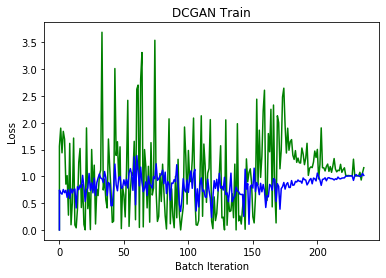

100%|██████████| 195/195 [00:27<00:00,  6.97it/s]


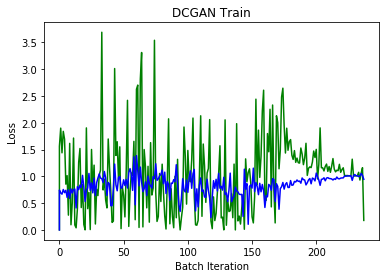

100%|██████████| 195/195 [00:27<00:00,  6.98it/s]


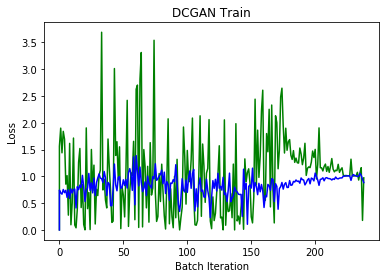

100%|██████████| 195/195 [00:27<00:00,  7.00it/s]


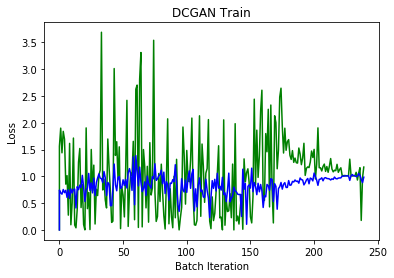

100%|██████████| 195/195 [00:27<00:00,  7.00it/s]


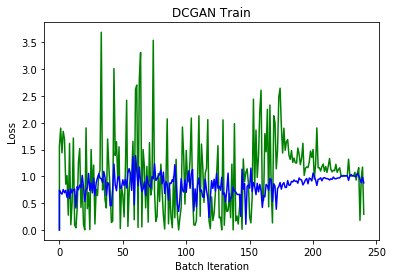

100%|██████████| 195/195 [00:28<00:00,  6.86it/s]


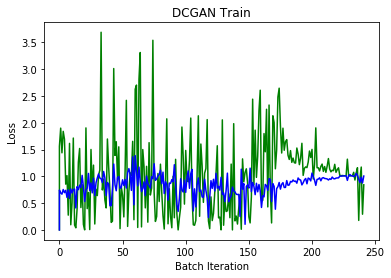

100%|██████████| 195/195 [00:28<00:00,  6.81it/s]


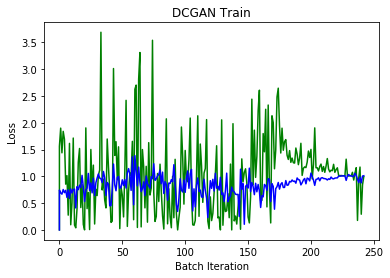

100%|██████████| 195/195 [00:28<00:00,  6.89it/s]


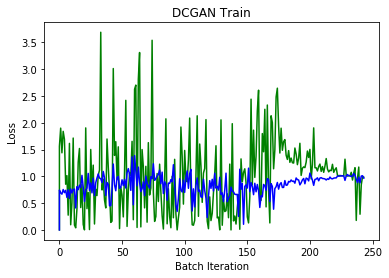

100%|██████████| 195/195 [00:28<00:00,  6.88it/s]


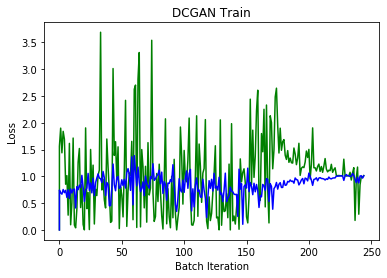

100%|██████████| 195/195 [00:28<00:00,  6.89it/s]


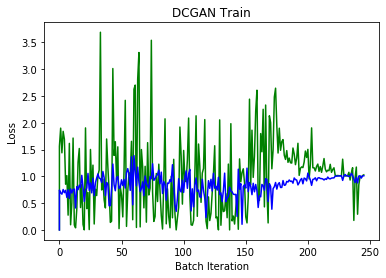

100%|██████████| 195/195 [00:28<00:00,  6.84it/s]


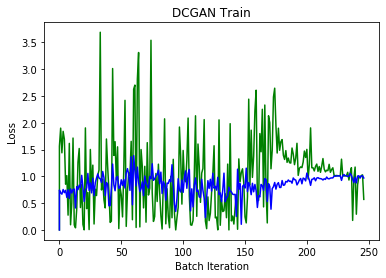

100%|██████████| 195/195 [00:28<00:00,  6.83it/s]


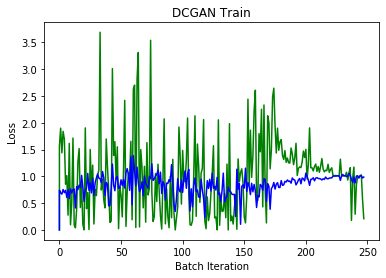

100%|██████████| 195/195 [00:28<00:00,  6.90it/s]


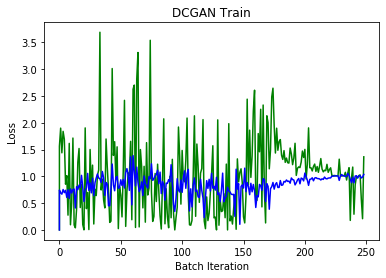

100%|██████████| 195/195 [00:27<00:00,  6.99it/s]


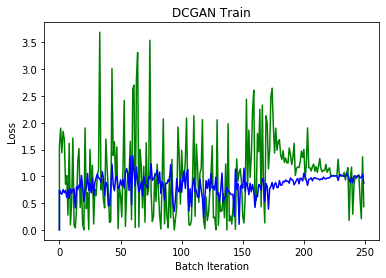

100%|██████████| 195/195 [00:27<00:00,  7.02it/s]


Discriminator loss:0.722 , Generator loss: 0.650  , Epoch: 250


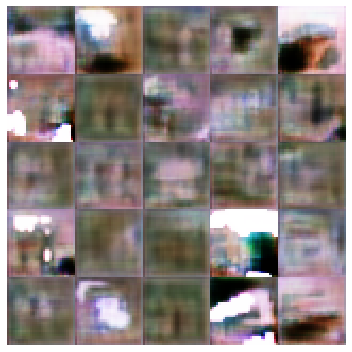

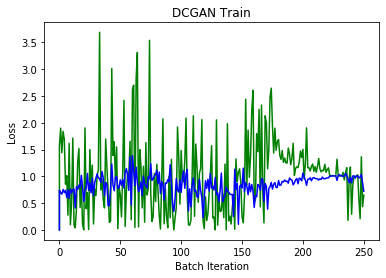

In [15]:
with tf.device('/GPU:0'):
    for epoch in range(num_epochs+1):
        for i in tqdm(range(number_of_batches)):            
            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            discriminator.trainable=True

            # Calculate loss on all-real batch
            batch_images = train_images[i*batch_size : (i+1)*batch_size]
            batch_labels = train_labels_encoded[i*batch_size : (i+1)*batch_size]
            real_loss = discriminator.train_on_batch(x=[batch_images, batch_labels], y=real_labels)

            # Calculate loss on fake batch
            noise = np.random.normal(loc=0, scale=1, size=(batch_size, 100))
            fake_output = generator.predict_on_batch([noise, batch_labels])
            fake_loss = discriminator.train_on_batch(x = [fake_output, batch_labels], y=fake_labels)

            # Discriminator loss
            
            d_loss_batch = real_loss + fake_loss

            for l in discriminator.layers:
                weights=l.get_weights()
                weights=[np.clip(w,-clip_value,clip_value) for w in weights]
                l.set_weights(weights)

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            discriminator.trainable=False
            g_loss_batch = gan.train_on_batch(x = [noise, batch_labels], y = real_labels)

        D_losses = np.append(D_losses, d_loss_batch[0])
        G_losses = np.append(G_losses, g_loss_batch[0])
        batches = np.append(batches, current_batch)
        current_batch += 1


        if epoch%50 == 0:
            tensorboard.on_epoch_end(epoch, {"D_real_acc":D_losses[1],"D_real_loss":D_losses[0] ,"D_fake_acc":fake_loss[1],"D_fake_loss":fake_loss[0],"GAN_acc":G_losses[1],"GAN_loss":G_losses[0]})
            print("Discriminator loss:%.3f , Generator loss: %.3f  , Epoch: %d" % (D_losses[-1],G_losses[-1],epoch))
            plot_generated_images(fake_output, epoch)
            saveWeights(epoch, generator, discriminator)

        # Each epoch update the loss graphs
        plt.figure(1)
        plt.plot(batches, G_losses, color='green', label='Generator Loss')
        plt.plot(batches, D_losses, color='blue', label='Discriminator Loss')
        plt.title("DCGAN Train")
        plt.xlabel("Batch Iteration")
        plt.ylabel("Loss")
        if epoch == 0:
            plt.legend()
        plt.pause(0.0000000001)
        plt.show()

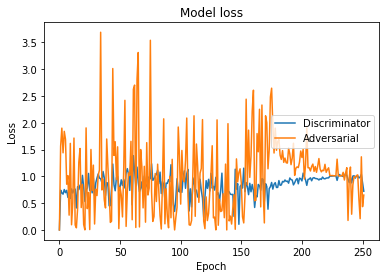

In [16]:
# plotting the metrics
plt.plot(D_losses)
plt.plot(G_losses)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Discriminator', 'Adversarial'], loc='center right')
plt.savefig('deep-learning/save-plots/sagan_%d_loss_epoch.png' % epoch)

# Frechet Inception Distance (FID)

In [ ]:
def scale_images(images, new_shape):
    images_list = list()
    for image in images:
        # resize with nearest neighbor interpolation
        new_image = resize(image, new_shape, 0)
        # store
        images_list.append(new_image) 
    return asarray(images_list) 

# calculate frechet inception distance
def calculate_fid(model, images1, images2):
    # calculate activations
    act1 = model.predict(images1)
    act2 = model.predict(images2)

    # calculate mean and covariance stats
    mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)

    # calculate sum squared difference between means
    ssdiff = np.sum((mu1 - mu2)**2.0)
    # calculate sqrt of product between cov
    covmean = sqrtm(sigma1.dot(sigma2))

    # check and correct imaginary numbers from sqrt
    if iscomplexobj(covmean):
        covmean = covmean.real
    # calculate score
    fid = ssdiff + trace(sigma1 + sigma2 - 2.0*covmean)
    return fid

# prepare the inception v3 model
model = InceptionV3(include_top = False, pooling = 'avg', input_shape = (299, 299, 3))

# define two image sets
# labels = train_labels_encoded[:1000]

test_labels_encoded = one_hot_encode(test_labels[:,])
labels = test_labels_encoded[:1000]
noise = np.random.normal(loc=0, scale=1, size=(1000, 100))
generated_output = generator.predict([noise, labels])
test_images = test_images[:1000]

# resize images
generated_test_images_scaled = scale_images(generated_output, (299, 299, 3))
test_images_scaled = scale_images(test_images, (299, 299, 3))

# FID between generated and test images
fid = calculate_fid(model, generated_test_images_scaled, test_images_scaled)
print('FID (same): %.3f' % fid)

## For testing purposes ##

In [22]:
generator.load_weights('deep-learning/save-weights/sagan_generator_epoch_0.h5')
def scale_images(images, new_shape):
    images_list = list()
    for image in images:
        # resize with nearest neighbor interpolation
        new_image = resize(image, new_shape, 0)
        # store
        images_list.append(new_image) 
    return asarray(images_list) 

# calculate frechet inception distance
def calculate_fid(model, images1, images2):
    # calculate activations
    act1 = model.predict(images1)
    act2 = model.predict(images2)

    # calculate mean and covariance stats
    mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)

    # calculate sum squared difference between means
    ssdiff = np.sum((mu1 - mu2)**2.0)
    # calculate sqrt of product between cov
    covmean = sqrtm(sigma1.dot(sigma2))

    # check and correct imaginary numbers from sqrt
    if iscomplexobj(covmean):
        covmean = covmean.real
    # calculate score
    fid = ssdiff + trace(sigma1 + sigma2 - 2.0*covmean)
    return fid

# prepare the inception v3 model
model = InceptionV3(include_top = False, pooling = 'avg', input_shape = (299, 299, 3))

# define two image sets
# labels = train_labels_encoded[:1000]

test_labels_encoded = one_hot_encode(test_labels[:,])
labels = test_labels_encoded[:1000]
noise = np.random.normal(loc=0, scale=1, size=(1000, 100))
generated_output = generator.predict([noise, labels])
test_images = test_images[:1000]

# resize images
generated_test_images_scaled = scale_images(generated_output, (299, 299, 3))
test_images_scaled = scale_images(test_images, (299, 299, 3))

# FID between generated and test images
fid = calculate_fid(model, generated_test_images_scaled, test_images_scaled)
print('FID (same): %.3f' % fid)

NameError: ignored